In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
adult = pd.read_csv("adult.csv")
adult.head()

,30,Private,77266,HS-grad,9,Divorced,Transport-moving,Not-in-family,White,Male,0,0.1,55,United-States,<=50K
0,26,Private,191648,Assoc-acdm,12,Never-married,Machine-op-inspct,Other-relative,White,Female,0,0,15,United-States,<=50K
1,81,?,120478,Assoc-voc,11,Divorced,?,Unmarried,White,Female,0,0,1,?,<=50K
2,32,Private,211349,10th,6,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,40,United-States,<=50K
3,22,Private,203715,Some-college,10,Never-married,Adm-clerical,Own-child,White,Male,0,0,40,United-States,<=50K
4,31,Private,292592,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Wife,White,Female,0,0,40,United-States,<=50K


In [5]:
adult = pd.read_csv("adult.csv", header=None)
adult.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,30,Private,77266,HS-grad,9,Divorced,Transport-moving,Not-in-family,White,Male,0,0,55,United-States,<=50K
1,26,Private,191648,Assoc-acdm,12,Never-married,Machine-op-inspct,Other-relative,White,Female,0,0,15,United-States,<=50K
2,81,?,120478,Assoc-voc,11,Divorced,?,Unmarried,White,Female,0,0,1,?,<=50K
3,32,Private,211349,10th,6,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,40,United-States,<=50K
4,22,Private,203715,Some-college,10,Never-married,Adm-clerical,Own-child,White,Male,0,0,40,United-States,<=50K


In [7]:
new_column_names = [
    "Age",                
    "Workclass",          
    "Fnlwgt", #Stands for "final weight," representing the number of people the census believes this entry represents.            
    "Education",          
    "Education_Num",      
    "Marital_Status",     
    "Occupation",         
    "Household_Role",     
    "Race",               
    "Gender",             
    "Capital_Gain",       
    "Capital_Loss",       
    "Hours_Per_Week",     
    "Native_Country",     
    "Income"              
]

In [9]:
adult.columns = new_column_names

In [11]:
adult.head()

,Age,Workclass,Fnlwgt,Education,Education_Num,Marital_Status,Occupation,Household_Role,Race,Gender,Capital_Gain,Capital_Loss,Hours_Per_Week,Native_Country,Income
0,30,Private,77266,HS-grad,9,Divorced,Transport-moving,Not-in-family,White,Male,0,0,55,United-States,<=50K
1,26,Private,191648,Assoc-acdm,12,Never-married,Machine-op-inspct,Other-relative,White,Female,0,0,15,United-States,<=50K
2,81,?,120478,Assoc-voc,11,Divorced,?,Unmarried,White,Female,0,0,1,?,<=50K
3,32,Private,211349,10th,6,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,40,United-States,<=50K
4,22,Private,203715,Some-college,10,Never-married,Adm-clerical,Own-child,White,Male,0,0,40,United-States,<=50K


In [13]:
adult.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5033 entries, 0 to 5032
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             5033 non-null   int64 
 1   Workclass       5033 non-null   object
 2   Fnlwgt          5033 non-null   int64 
 3   Education       5033 non-null   object
 4   Education_Num   5033 non-null   int64 
 5   Marital_Status  5033 non-null   object
 6   Occupation      5033 non-null   object
 7   Household_Role  5033 non-null   object
 8   Race            5033 non-null   object
 9   Gender          5033 non-null   object
 10  Capital_Gain    5033 non-null   int64 
 11  Capital_Loss    5033 non-null   int64 
 12  Hours_Per_Week  5033 non-null   int64 
 13  Native_Country  5033 non-null   object
 14  Income          5033 non-null   object
dtypes: int64(6), object(9)
memory usage: 589.9+ KB


In [15]:
duplicates = adult[adult.duplicated()]
print(f"Number of duplicate rows: {len(duplicates)}")

Number of duplicate rows: 0


In [17]:
print("Age column data type:", adult["Age"].dtype)

Age column data type: int64


In [19]:
age_summary = adult["Age"].describe()
print("Age column summary:\n", age_summary)

Age column summary:
 count    5033.000000
mean       38.623684
std        13.424887
min        17.000000
25%        28.000000
50%        37.000000
75%        47.000000
max        90.000000
Name: Age, dtype: float64


In [21]:
valid_age_range = (0, 120)
invalid_ages = adult[(adult["Age"] < valid_age_range[0]) | (adult["Age"] > valid_age_range[1])]
print("Invalid ages:\n", invalid_ages)

Invalid ages:
 Empty DataFrame
Columns: [Age, Workclass, Fnlwgt, Education, Education_Num, Marital_Status, Occupation, Household_Role, Race, Gender, Capital_Gain, Capital_Loss, Hours_Per_Week, Native_Country, Income]
Index: []


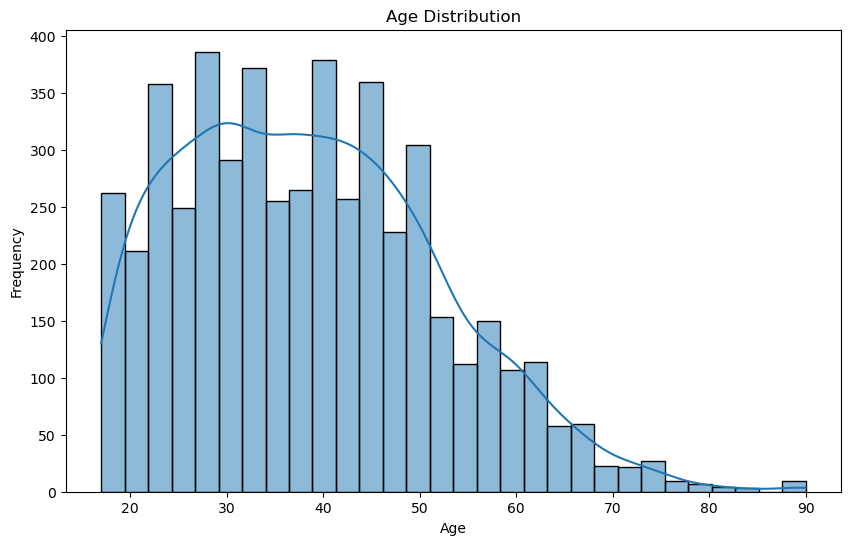

In [23]:
plt.figure(figsize=(10, 6))
sns.histplot(adult["Age"], bins=30, kde=True)
plt.title("Age Distribution")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.show()

In [25]:
print("Unique values in Workclass:\n", adult["Workclass"].unique())

Unique values in Workclass:
 [' Private' ' ?' ' State-gov' ' Local-gov' ' Self-emp-not-inc'
 ' Self-emp-inc' ' Federal-gov' ' Without-pay']


In [27]:
adult["Workclass"] = adult["Workclass"].str.strip()
missing_workclass = adult[adult["Workclass"] == "?"]
print(f"Number of placeholder ('?') values in Workclass: {len(missing_workclass)}")

Number of placeholder ('?') values in Workclass: 307


In [29]:
missing_education = adult[adult["Education"].isnull()]
print(f"Number of missing values in Education: {len(missing_education)}")

Number of missing values in Education: 0


In [31]:
print("Unique values in Education:\n", adult["Education"].unique())

Unique values in Education:
 [' HS-grad' ' Assoc-acdm' ' Assoc-voc' ' 10th' ' Some-college'
 ' Bachelors' ' Doctorate' ' 12th' ' Masters' ' Prof-school' ' 11th'
 ' 9th' ' 7th-8th' ' 1st-4th' ' 5th-6th' ' Preschool']


In [33]:
adult["Workclass"] = adult["Workclass"].str.strip()  
adult["Education"] = adult["Education"].str.strip()  

In [35]:
workclass_by_education = adult[adult["Workclass"] != "?"].groupby("Education")["Workclass"].agg(lambda x: x.mode()[0])
print("Most frequent Workclass by Education:\n", workclass_by_education)

Most frequent Workclass by Education:
 Education
10th            Private
11th            Private
12th            Private
1st-4th         Private
5th-6th         Private
7th-8th         Private
9th             Private
Assoc-acdm      Private
Assoc-voc       Private
Bachelors       Private
Doctorate       Private
HS-grad         Private
Masters         Private
Preschool       Private
Prof-school     Private
Some-college    Private
Name: Workclass, dtype: object


In [37]:
def impute_workclass(row):
    if row["Workclass"] == "?":
        return workclass_by_education[row["Education"]]
    else:
        return row["Workclass"]

In [39]:
adult["Workclass"] = adult.apply(impute_workclass, axis=1)

In [41]:
print("Workclass distribution after imputation:\n", adult["Workclass"].value_counts())

Workclass distribution after imputation:
 Workclass
Private             3800
Self-emp-not-inc     368
Local-gov            338
State-gov            196
Self-emp-inc         178
Federal-gov          150
Without-pay            3
Name: count, dtype: int64


In [43]:
fnlwgt_summary = adult["Fnlwgt"].describe()
print("Fnlwgt column summary:\n", fnlwgt_summary)

Fnlwgt column summary:
 count    5.033000e+03
mean     1.877222e+05
std      1.041220e+05
min      1.930200e+04
25%      1.158310e+05
50%      1.762700e+05
75%      2.371410e+05
max      1.033222e+06
Name: Fnlwgt, dtype: float64


In [45]:
missing_fnlwgt = adult[adult["Fnlwgt"].isnull()]
print(f"Number of missing values in Fnlwgt: {len(missing_fnlwgt)}")

Number of missing values in Fnlwgt: 0


In [47]:
unique_fnlwgt_count = adult["Fnlwgt"].nunique()
print(f"Number of unique values in Fnlwgt: {unique_fnlwgt_count} (out of {len(adult)})")

Number of unique values in Fnlwgt: 4615 (out of 5033)


In [49]:
missing_education_num = adult[adult["Education_Num"].isnull()]
print(f"Number of missing values in Education_Num: {len(missing_education_num)}")

Number of missing values in Education_Num: 0


In [51]:
education_num_summary = adult["Education_Num"].describe()
print("Education_Num summary:\n", education_num_summary)

Education_Num summary:
 count    5033.000000
mean       10.093781
std         2.562406
min         1.000000
25%         9.000000
50%        10.000000
75%        12.000000
max        16.000000
Name: Education_Num, dtype: float64


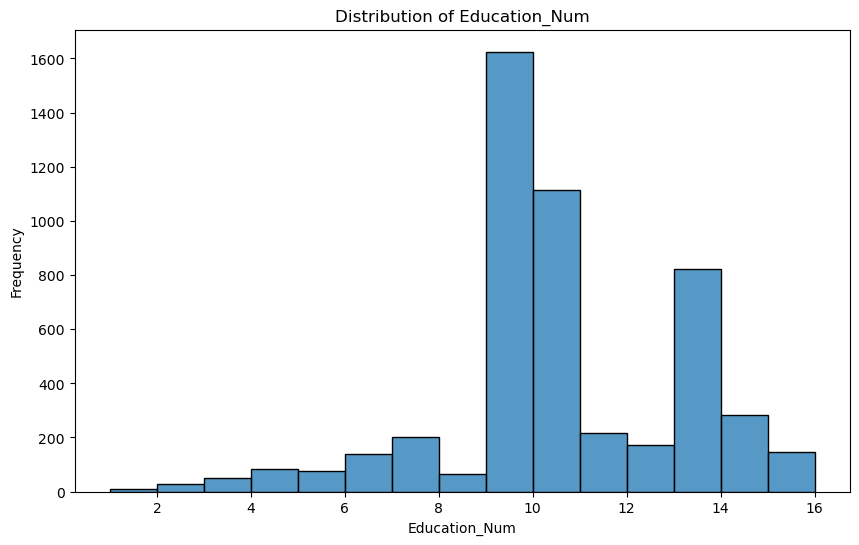

In [53]:
plt.figure(figsize=(10, 6))
sns.histplot(adult["Education_Num"], bins=15, kde=False)
plt.title("Distribution of Education_Num")
plt.xlabel("Education_Num")
plt.ylabel("Frequency")
plt.show()

In [55]:
education_mapping = adult.groupby("Education")["Education_Num"].unique()
print("Mapping of Education to Education_Num:\n", education_mapping)

Mapping of Education to Education_Num:
 Education
10th             [6]
11th             [7]
12th             [8]
1st-4th          [2]
5th-6th          [3]
7th-8th          [4]
9th              [5]
Assoc-acdm      [12]
Assoc-voc       [11]
Bachelors       [13]
Doctorate       [16]
HS-grad          [9]
Masters         [14]
Preschool        [1]
Prof-school     [15]
Some-college    [10]
Name: Education_Num, dtype: object


In [57]:
inconsistent_rows = adult[~adult.apply(lambda x: x["Education_Num"] in education_mapping[x["Education"]], axis=1)]
print(f"Number of inconsistent rows: {len(inconsistent_rows)}")
if not inconsistent_rows.empty:
    print("Inconsistent rows:\n", inconsistent_rows.head())

Number of inconsistent rows: 0


In [59]:
unique_education_num = adult["Education_Num"].nunique()
print(f"Number of unique values in Education_Num: {unique_education_num}")

Number of unique values in Education_Num: 16


In [61]:
#Martial_Status
missing_marital_status = adult[adult["Marital_Status"].isnull()]
print(f"Number of missing values in Marital_Status: {len(missing_marital_status)}")

Number of missing values in Marital_Status: 0


In [63]:
unique_marital_status = adult["Marital_Status"].unique()
print("Unique values in Marital_Status:\n", unique_marital_status)

Unique values in Marital_Status:
 [' Divorced' ' Never-married' ' Married-civ-spouse' ' Separated'
 ' Married-spouse-absent' ' Widowed' ' Married-AF-spouse']


In [65]:
marital_status_distribution = adult["Marital_Status"].value_counts()
print("Frequency distribution of Marital_Status:\n", marital_status_distribution)

Frequency distribution of Marital_Status:
 Marital_Status
Married-civ-spouse       2320
Never-married            1629
Divorced                  708
Widowed                   156
Separated                 150
Married-spouse-absent      67
Married-AF-spouse           3
Name: count, dtype: int64


In [67]:
#Occupation
missing_occupation = adult[adult["Occupation"].isnull()]
print(f"Number of missing values in Occupation: {len(missing_occupation)}")

Number of missing values in Occupation: 0


In [69]:
unique_occupation = adult["Occupation"].unique()
print("Unique values in Occupation:\n", unique_occupation)

Unique values in Occupation:
 [' Transport-moving' ' Machine-op-inspct' ' ?' ' Adm-clerical' ' Sales'
 ' Prof-specialty' ' Exec-managerial' ' Protective-serv' ' Craft-repair'
 ' Other-service' ' Tech-support' ' Handlers-cleaners' ' Farming-fishing'
 ' Priv-house-serv' ' Armed-Forces']


In [71]:
occupation_distribution = adult["Occupation"].value_counts()
print("Frequency distribution of Occupation:\n", occupation_distribution)

Frequency distribution of Occupation:
 Occupation
Prof-specialty       647
Exec-managerial      634
Craft-repair         622
Adm-clerical         574
Sales                562
Other-service        501
?                    307
Machine-op-inspct    302
Transport-moving     245
Handlers-cleaners    192
Farming-fishing      158
Tech-support         156
Protective-serv      107
Priv-house-serv       24
Armed-Forces           2
Name: count, dtype: int64


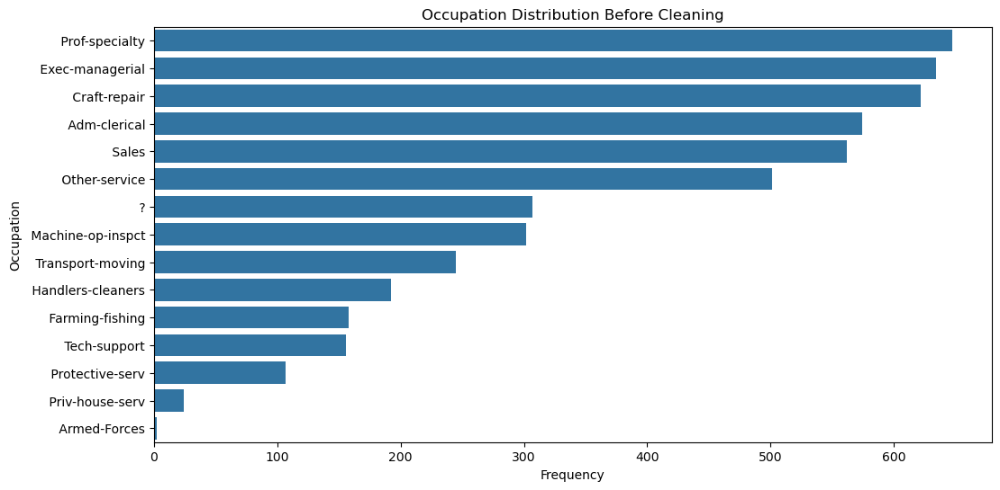

In [73]:
plt.figure(figsize=(12, 6))
sns.countplot(data=adult, y="Occupation", order=adult["Occupation"].value_counts().index)
plt.title("Occupation Distribution Before Cleaning")
plt.xlabel("Frequency")
plt.ylabel("Occupation")
plt.show()

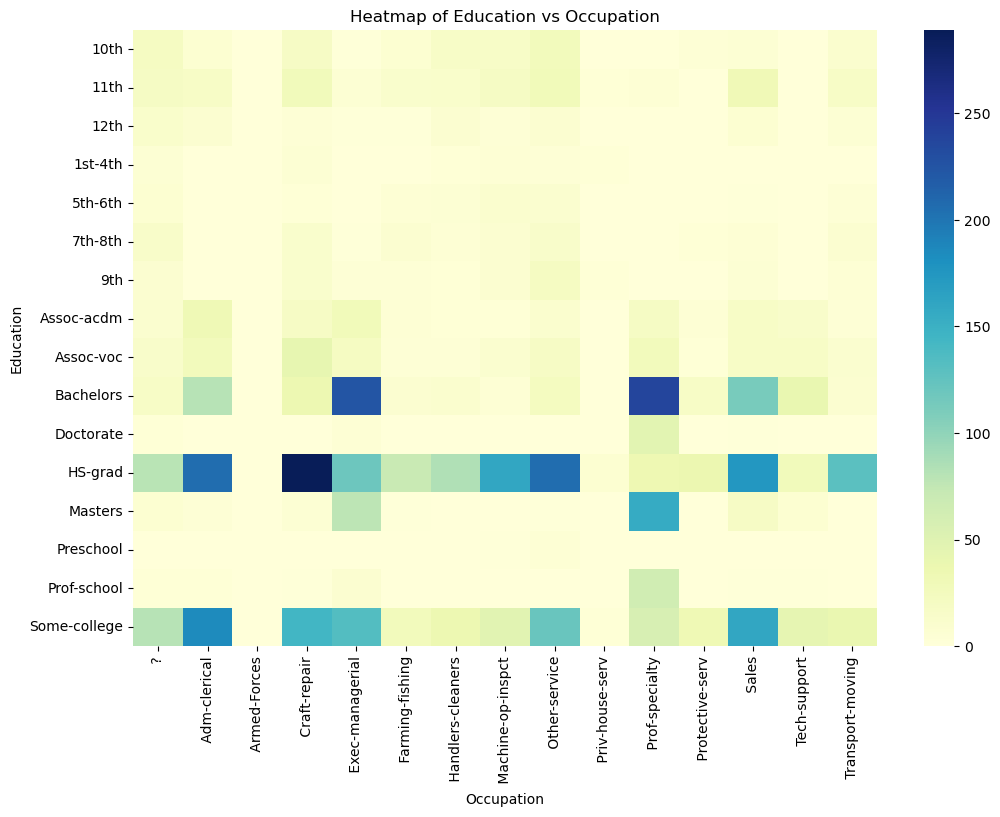

In [75]:
education_occupation = adult[adult["Occupation"] != "?"].pivot_table(
    index="Education", columns="Occupation", aggfunc="size", fill_value=0
)
plt.figure(figsize=(12, 8))
sns.heatmap(education_occupation, cmap="YlGnBu", annot=False)
plt.title("Heatmap of Education vs Occupation")
plt.xlabel("Occupation")
plt.ylabel("Education")
plt.show()

In [77]:
adult["Occupation"] = adult["Occupation"].str.strip()

In [79]:
adult["Occupation"] = adult["Occupation"].str.strip().replace("?", None)

In [81]:
occupation_mapping = (
    adult.dropna(subset=["Occupation"])  # Exclude NaN in Occupation
    .groupby("Education")["Occupation"]
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)
    .to_dict()
)

In [83]:
print("Mapping of Education to Occupation Mode:\n", occupation_mapping)

Mapping of Education to Occupation Mode:
 {'10th': 'Other-service', '11th': 'Sales', '12th': 'Adm-clerical', '1st-4th': 'Craft-repair', '5th-6th': 'Machine-op-inspct', '7th-8th': 'Other-service', '9th': 'Other-service', 'Assoc-acdm': 'Adm-clerical', 'Assoc-voc': 'Craft-repair', 'Bachelors': 'Prof-specialty', 'Doctorate': 'Prof-specialty', 'HS-grad': 'Craft-repair', 'Masters': 'Prof-specialty', 'Preschool': 'Other-service', 'Prof-school': 'Prof-specialty', 'Some-college': 'Adm-clerical'}


In [85]:
def impute_occupation(row):
    if pd.isnull(row["Occupation"]):  
        return occupation_mapping.get(row["Education"], "Unknown")  
    return row["Occupation"]

In [87]:
adult["Occupation"] = adult.apply(impute_occupation, axis=1)

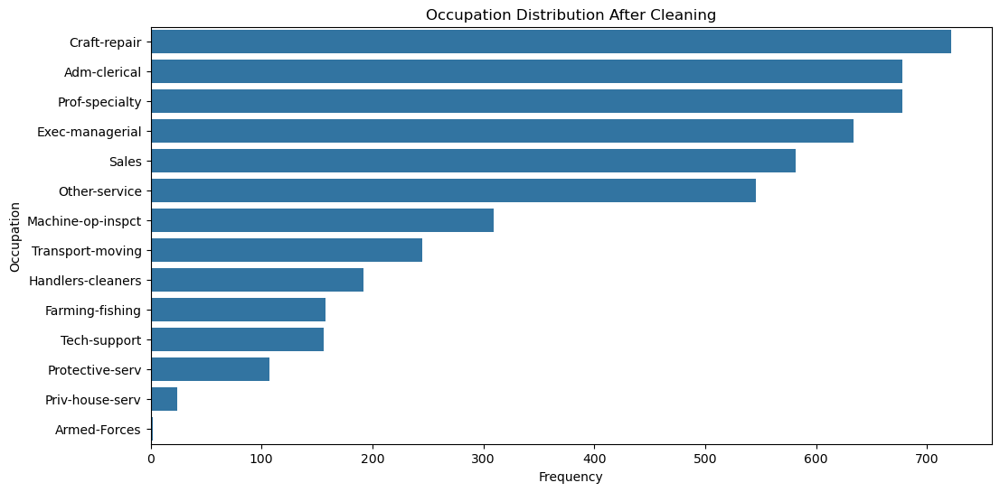

In [89]:
plt.figure(figsize=(12, 6))
sns.countplot(data=adult, y="Occupation", order=adult["Occupation"].value_counts().index)
plt.title("Occupation Distribution After Cleaning")
plt.xlabel("Frequency")
plt.ylabel("Occupation")
plt.show()

In [91]:
remaining_placeholders = adult[adult["Occupation"].isnull()]
print(f"Number of NaN values in Occupation after cleaning: {len(remaining_placeholders)}")

Number of NaN values in Occupation after cleaning: 0


In [93]:
#Household_Role
missing_household_role = adult[adult["Household_Role"].isnull()]
print(f"Number of missing values in Household_Role: {len(missing_household_role)}")

Number of missing values in Household_Role: 0


In [95]:
unique_household_roles = adult["Household_Role"].unique()
print("Unique values in Household_Role:\n", unique_household_roles)

Unique values in Household_Role:
 [' Not-in-family' ' Other-relative' ' Unmarried' ' Husband' ' Own-child'
 ' Wife']


In [97]:
household_role_distribution = adult["Household_Role"].value_counts()
print("Frequency distribution of Household_Role:\n", household_role_distribution)

Frequency distribution of Household_Role:
 Household_Role
Husband           2039
Not-in-family     1308
Own-child          768
Unmarried          527
Wife               251
Other-relative     140
Name: count, dtype: int64


In [99]:
#Race
missing_race = adult[adult["Race"].isnull()]
print(f"Number of misssing values in Race: {len(missing_race)}")

Number of misssing values in Race: 0


In [101]:
unique_race = adult["Race"].unique()
print("Unique values in Race:\n", unique_race)

Unique values in Race:
 [' White' ' Asian-Pac-Islander' ' Black' ' Other' ' Amer-Indian-Eskimo']


In [103]:
race_distribution = adult["Race"].value_counts()
print("Frequency distribution of Race:\n", race_distribution)

Frequency distribution of Race:
 Race
White                 4272
Black                  525
Asian-Pac-Islander     161
Amer-Indian-Eskimo      40
Other                   35
Name: count, dtype: int64


In [105]:
#Gender
missing_gender = adult[adult["Gender"].isnull()]
print(f"Number of missing values in Gender: {len(missing_gender)}")

Number of missing values in Gender: 0


In [107]:
unique_gender = adult["Gender"].unique()
print("Unique values in Gender:\n", unique_gender)

Unique values in Gender:
 [' Male' ' Female']


In [109]:
gender_distribution = adult["Gender"].value_counts()
print("Frequency distribution of Gender:\n", gender_distribution)

Frequency distribution of Gender:
 Gender
Male      3380
Female    1653
Name: count, dtype: int64


In [111]:
#Capital_Gain
missing_capital_gain = adult[adult["Capital_Gain"].isnull()]
print(f"Number of missing values in Capital Gain: {len(missing_capital_gain)}")

Number of missing values in Capital Gain: 0


In [113]:
unique_cap_gain = adult["Capital_Gain"].unique()
print("Unique values in Capital Gain:\n", unique_cap_gain)

Unique values in Capital Gain:
 [    0 15020  1086  7298 15024  1506  1471  7688 99999 13550  7430 14344
  8614  2829  3325  2176  5013  1055  3411  3137  9386  3103 10520  4386
  4650  5178  1151  4687  4787  3674  2407  4865  3464   594  2290  2907
  7443 14084  4101  2202  2964  2105   114  2463  3818  6849  2174  6360
  3942  2885  2977 25124  3781  4508 20051  2936 10566 27828  2993  4064
  3887 15831   401  6514  2961  6767  2228  1409  2635  5556 34095  2050
  1111  2597 25236 10605  2580  3471  2329]


In [115]:
cap_gain_distribution = adult["Capital_Gain"].value_counts()
print("frequency distribution of Captial Gain:\n", cap_gain_distribution)

frequency distribution of Captial Gain:
 Capital_Gain
0        4633
15024      49
7688       44
7298       43
99999      22
         ... 
1086        1
2936        1
10566       1
2993        1
2329        1
Name: count, Length: 79, dtype: int64


In [117]:
zero_percentage = (adult["Capital_Gain"] == 0).mean() * 100
print(f"Percentage of 0 values in Capital_Gain: {zero_percentage:.2f}%")

Percentage of 0 values in Capital_Gain: 92.05%


In [119]:
non_zero_capital_gain = adult[adult["Capital_Gain"] > 0]
print(f"Number of non-zero values: {len(non_zero_capital_gain)}")
print(f"Unique non-zero values: {non_zero_capital_gain['Capital_Gain'].unique()}")

Number of non-zero values: 400
Unique non-zero values: [15020  1086  7298 15024  1506  1471  7688 99999 13550  7430 14344  8614
  2829  3325  2176  5013  1055  3411  3137  9386  3103 10520  4386  4650
  5178  1151  4687  4787  3674  2407  4865  3464   594  2290  2907  7443
 14084  4101  2202  2964  2105   114  2463  3818  6849  2174  6360  3942
  2885  2977 25124  3781  4508 20051  2936 10566 27828  2993  4064  3887
 15831   401  6514  2961  6767  2228  1409  2635  5556 34095  2050  1111
  2597 25236 10605  2580  3471  2329]


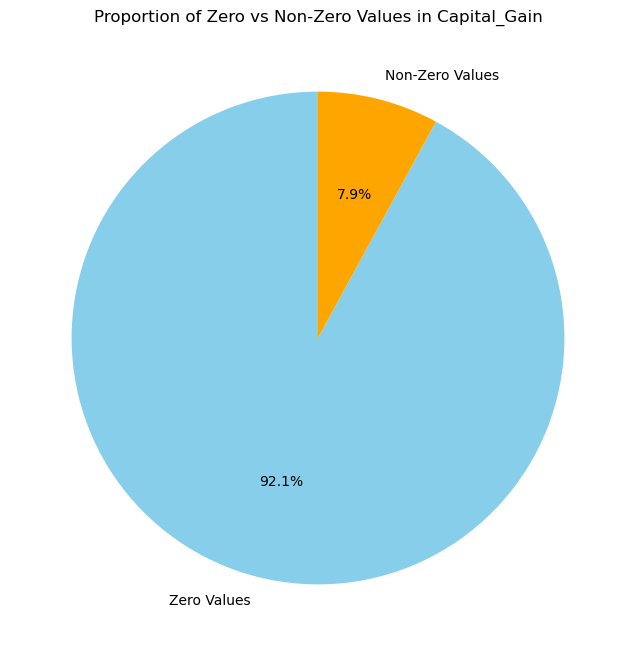

In [121]:
capital_gain_counts = [
    (adult["Capital_Gain"] == 0).sum(),  # Count of 0 values
    (adult["Capital_Gain"] > 0).sum()   # Count of non-zero values
]

capital_gain_labels = ["Zero Values", "Non-Zero Values"]

# Plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(capital_gain_counts, labels=capital_gain_labels, autopct='%1.1f%%', startangle=90, colors=["skyblue", "orange"])
plt.title("Proportion of Zero vs Non-Zero Values in Capital_Gain")
plt.show()

In [123]:
adult["Income"] = adult["Income"].str.strip()
capital_gain_correlation = adult[["Capital_Gain", "Income"]].groupby("Income")["Capital_Gain"].mean()
print("Average Capital_Gain by Income:\n", capital_gain_correlation)

Average Capital_Gain by Income:
 Income
<=50K     135.435654
>50K     3532.466559
Name: Capital_Gain, dtype: float64


In [125]:
non_zero_capital_gain = adult[adult["Capital_Gain"] > 0].copy()  # Use .copy() to avoid warnings
non_zero_capital_gain.loc[:, "Gender"] = non_zero_capital_gain["Gender"].str.strip()

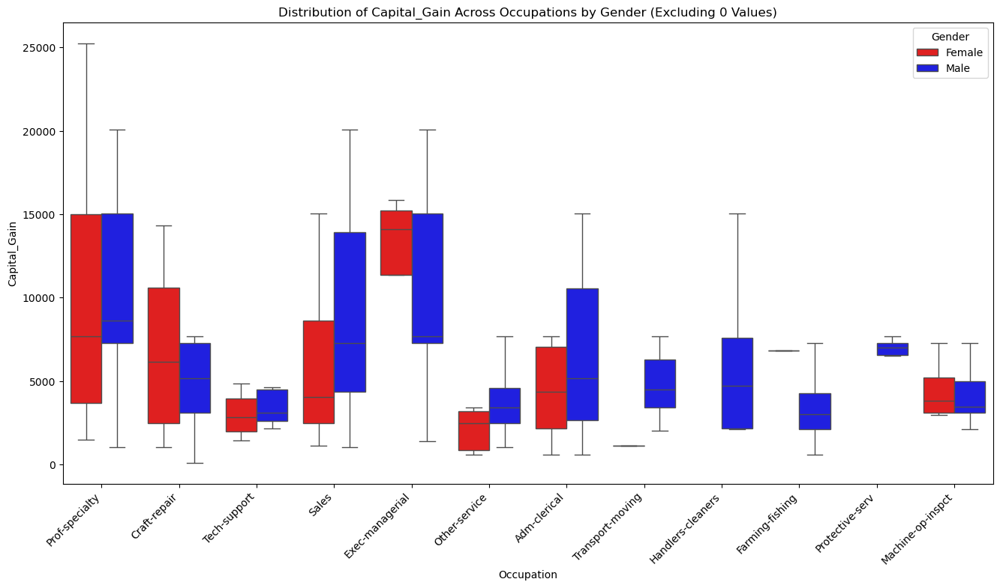

In [127]:
plt.figure(figsize=(16, 8))
sns.boxplot(
    data=non_zero_capital_gain,
    x="Occupation",
    y="Capital_Gain",
    hue="Gender",
    palette={"Female": "red", "Male": "blue"},
    showfliers=False,
)
plt.xticks(rotation=45, ha="right")
plt.title("Distribution of Capital_Gain Across Occupations by Gender (Excluding 0 Values)")
plt.xlabel("Occupation")
plt.ylabel("Capital_Gain")
plt.legend(title="Gender")
plt.show()

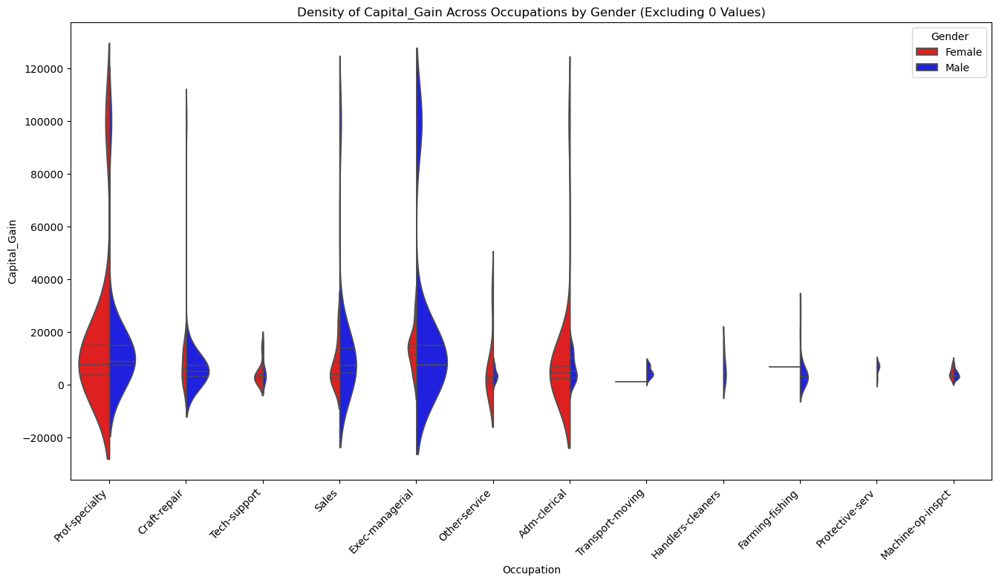

In [129]:
plt.figure(figsize=(16, 8))
sns.violinplot(
    data=non_zero_capital_gain,
    x="Occupation",
    y="Capital_Gain",
    hue="Gender",
    split=True,
    palette={"Female": "red", "Male": "blue"},  # Inline color mapping
    density_norm="count",
    inner="quartile",
)
plt.xticks(rotation=45, ha="right")
plt.title("Density of Capital_Gain Across Occupations by Gender (Excluding 0 Values)")
plt.xlabel("Occupation")
plt.ylabel("Capital_Gain")
plt.legend(title="Gender")
plt.show()

In [131]:
#Capital_Loss
missing_capital_loss = adult[adult["Capital_Loss"].isnull()]
print(f"Number of missing values in Capital Loss: {len(missing_capital_loss)}")

Number of missing values in Capital Loss: 0


In [133]:
unique_cap_loss = adult["Capital_Loss"].unique()
print("Unique values in Capital Loss:\n", unique_cap_loss)

Unique values in Capital Loss:
 [   0 1977  880 1741 1887 1902 1672 2415 1485 2042 1411 2258 2444 1408
  323 1848 2051 1762 2339 1719 1602 1740 1564 1340 1628 3683 2001 1590
 1980 2002 2467 1594 2824 1669 2057 2231 1876 1825  213 1735 1504 1579
 2547 2489 2377 1974 1573 2179 1816 2206 1380 1721 2352  653 2392 1651]


In [135]:
cap_loss_distribution = adult["Capital_Loss"].value_counts()
print("frequency distribution of Captial Loss:\n", cap_loss_distribution.head())

frequency distribution of Captial Loss:
 Capital_Loss
0       4787
1902      41
1887      28
1977      22
2415      11
Name: count, dtype: int64


In [137]:
zero_percentage_loss = (adult["Capital_Loss"] == 0).mean() * 100
print(f"Percentage of 0 values in Capital_Loss: {zero_percentage_loss:.2f}%")

Percentage of 0 values in Capital_Loss: 95.11%


In [139]:
non_zero_capital_loss = adult[adult["Capital_Loss"] > 0]
print(f"Number of non-zero values: {len(non_zero_capital_loss)}")
print(f"Unique non-zero values: {non_zero_capital_loss['Capital_Loss'].unique()}")

Number of non-zero values: 246
Unique non-zero values: [1977  880 1741 1887 1902 1672 2415 1485 2042 1411 2258 2444 1408  323
 1848 2051 1762 2339 1719 1602 1740 1564 1340 1628 3683 2001 1590 1980
 2002 2467 1594 2824 1669 2057 2231 1876 1825  213 1735 1504 1579 2547
 2489 2377 1974 1573 2179 1816 2206 1380 1721 2352  653 2392 1651]


In [141]:
non_zero_capital_loss = adult[adult["Capital_Loss"] > 0].copy()
non_zero_capital_loss["Gender"] = non_zero_capital_loss["Gender"].str.strip()

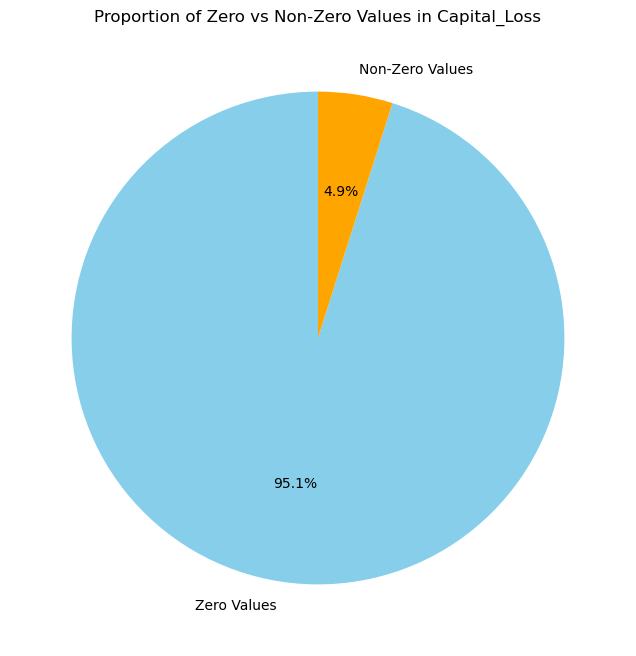

In [143]:
capital_loss_counts = [
    (adult["Capital_Loss"] == 0).sum(),
    (adult["Capital_Loss"] > 0).sum(),
]
capital_loss_labels = ["Zero Values", "Non-Zero Values"]

plt.figure(figsize=(8, 8))
plt.pie(
    capital_loss_counts,
    labels=capital_loss_labels,
    autopct="%1.1f%%",
    startangle=90,
    colors=["skyblue", "orange"],
)
plt.title("Proportion of Zero vs Non-Zero Values in Capital_Loss")
plt.show()

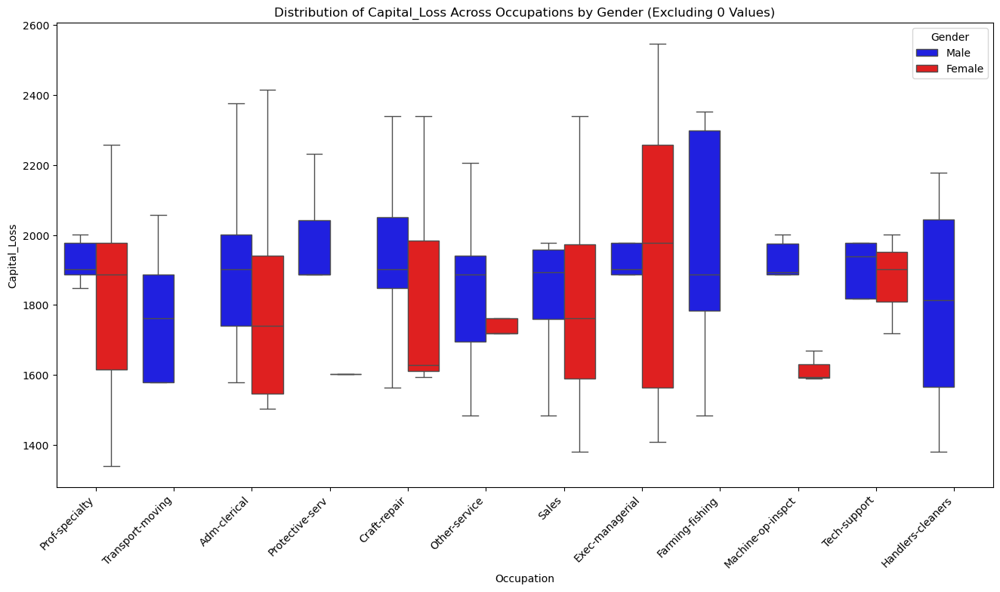

In [145]:
plt.figure(figsize=(16, 8))
sns.boxplot(
    data=non_zero_capital_loss,
    x="Occupation",
    y="Capital_Loss",
    hue="Gender",
    palette={"Female": "red", "Male": "blue"},
    showfliers=False,
)
plt.xticks(rotation=45, ha="right")
plt.title("Distribution of Capital_Loss Across Occupations by Gender (Excluding 0 Values)")
plt.xlabel("Occupation")
plt.ylabel("Capital_Loss")
plt.legend(title="Gender")
plt.show()

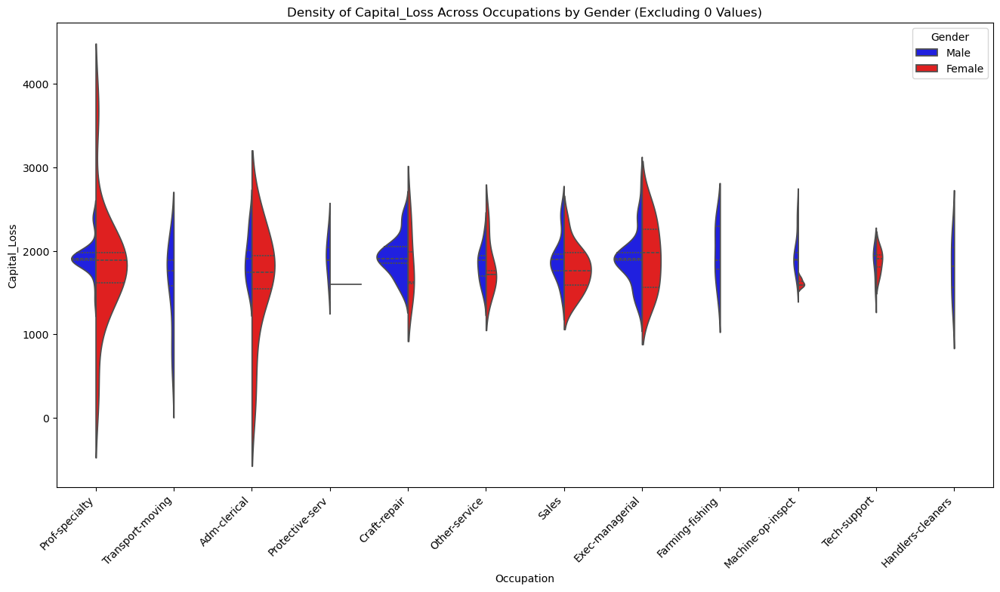

In [147]:
plt.figure(figsize=(16, 8))
sns.violinplot(
    data=non_zero_capital_loss,
    x="Occupation",
    y="Capital_Loss",
    hue="Gender",
    split=True,
    palette={"Female": "red", "Male": "blue"},
    density_norm="count",
    inner="quartile",
)
plt.xticks(rotation=45, ha="right")
plt.title("Density of Capital_Loss Across Occupations by Gender (Excluding 0 Values)")
plt.xlabel("Occupation")
plt.ylabel("Capital_Loss")
plt.legend(title="Gender")
plt.show()

In [149]:
#Hours_Per_Week
missing_hours = adult[adult["Hours_Per_Week"].isnull()]
print(f"Number of missing values in Hours_Per_Week: {len(missing_hours)}")

Number of missing values in Hours_Per_Week: 0


In [151]:
unique_hours = adult["Hours_Per_Week"].unique()
print("Unique values in Hours_Per_Week:\n", unique_hours)

Unique values in Hours_Per_Week:
 [55 15  1 40 35 99 60 50 39 46 45 10 32 25 48 30 20  3 65 52 84 28 70 37
 42 47 81 89 56 44 38 31 16 43 34 72 36 80 24  5 68  4 98 18 12 14 62 17
 23 64 54  9 41 26 53 22 58 90 33 66  8 27 57 21 29 63 75  6  2 49 19 97
 13 59  7 78 11]


In [153]:
hours_summary = adult["Hours_Per_Week"].describe()
print("Summary statistics for Hours_Per_Week:\n", hours_summary)

Summary statistics for Hours_Per_Week:
 count    5033.000000
mean       40.425392
std        12.304289
min         1.000000
25%        40.000000
50%        40.000000
75%        45.000000
max        99.000000
Name: Hours_Per_Week, dtype: float64


In [155]:
hours_distribution = adult["Hours_Per_Week"].value_counts().sort_index()
print("Frequency distribution of Hours_Per_Week:\n", hours_distribution)

Frequency distribution of Hours_Per_Week:
 Hours_Per_Week
1      6
2      6
3      6
4     11
5     12
      ..
89     1
90     5
97     1
98     3
99    10
Name: count, Length: 77, dtype: int64


In [157]:
low_hours_rows = adult[adult["Hours_Per_Week"] <= 5]
print("Rows with very low Hours_Per_Week:\n", low_hours_rows)

Rows with very low Hours_Per_Week:
       Age         Workclass  Fnlwgt     Education  Education_Num  \
2      81           Private  120478     Assoc-voc             11   
32     85           Private   98611     Bachelors             13   
67     82           Private  403910       HS-grad              9   
289    50  Self-emp-not-inc  240922    Assoc-acdm             12   
305    80           Private  281768    Assoc-acdm             12   
306    31           Private  160594    Assoc-acdm             12   
487    18           Private   41973          11th              7   
505    18           Private   36162          11th              7   
675    61           Private  154600       HS-grad              9   
821    64           Private  169917       7th-8th              4   
1100   28           Private  247819     Assoc-voc             11   
1118   17           Private  277541          11th              7   
1179   47           Private   39530       HS-grad              9   
1321   22   

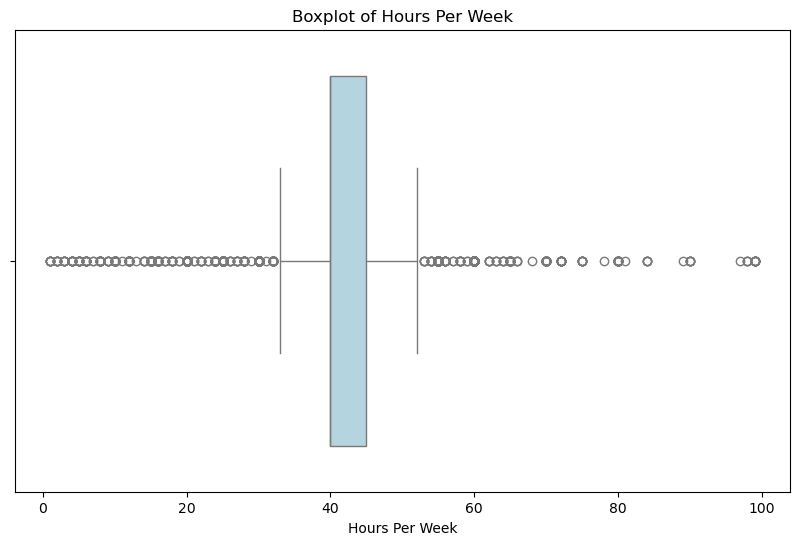

In [159]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=adult, x="Hours_Per_Week", color="lightblue")
plt.title("Boxplot of Hours Per Week")
plt.xlabel("Hours Per Week")
plt.show()

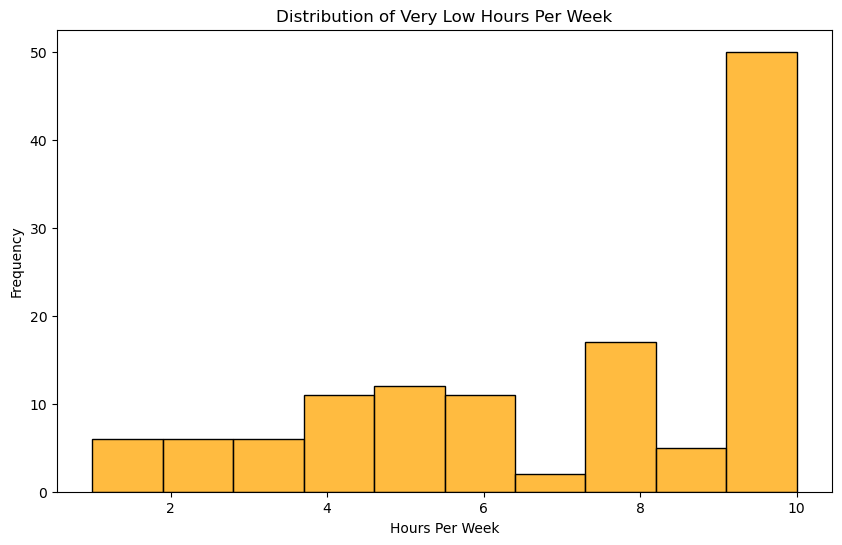

In [161]:
plt.figure(figsize=(10, 6))
sns.histplot(adult[adult["Hours_Per_Week"] <= 10]["Hours_Per_Week"], bins=10, color="orange", kde=False)
plt.title("Distribution of Very Low Hours Per Week")
plt.xlabel("Hours Per Week")
plt.ylabel("Frequency")
plt.show()

In [163]:
low_hours_data = adult[adult["Hours_Per_Week"] < 10]

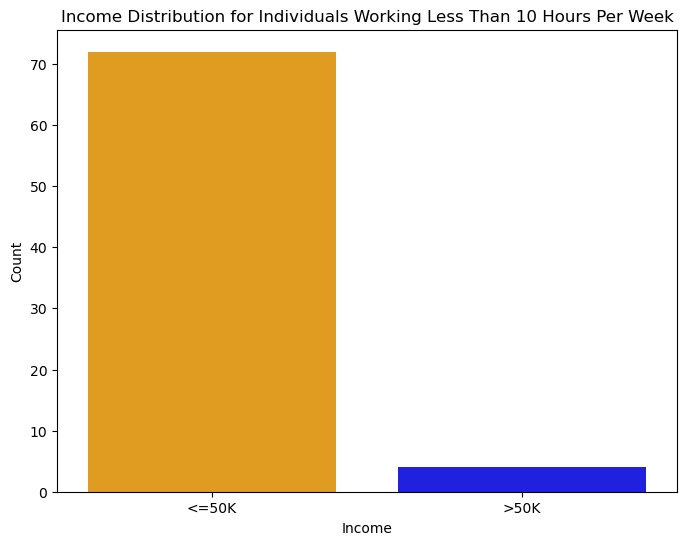

In [165]:
plt.figure(figsize=(8, 6))
sns.countplot(
    data=low_hours_data,
    x="Income",
    hue="Income", 
    palette={"<=50K": "orange", ">50K": "blue"},  
    dodge=False,  
)
plt.title("Income Distribution for Individuals Working Less Than 10 Hours Per Week")
plt.xlabel("Income")
plt.ylabel("Count")
plt.legend([], [], frameon=False)  
plt.show()

In [167]:
income_counts = low_hours_data["Income"].value_counts(normalize=True) * 100
print("Percentage distribution of Income for less than 10 work hours:\n", income_counts)

Percentage distribution of Income for less than 10 work hours:
 Income
<=50K    94.736842
>50K      5.263158
Name: proportion, dtype: float64


In [169]:
low_hours_high_income = adult[(adult["Hours_Per_Week"] < 10) & (adult["Income"] == ">50K")]

In [171]:
print("Occupation breakdown for individuals working less than 10 hours with income >50K:\n")
occupation_counts = low_hours_high_income["Occupation"].value_counts()
print(occupation_counts)

Occupation breakdown for individuals working less than 10 hours with income >50K:

Occupation
Prof-specialty      1
Adm-clerical        1
Protective-serv     1
Transport-moving    1
Name: count, dtype: int64


In [173]:
#those will be treated as special occasions 

In [175]:
# Native_Country
missing_countries = adult[adult["Native_Country"].isnull()]
print(f"Number of missing values in Native_Country: {len(missing_countries)}")

Number of missing values in Native_Country: 0


In [177]:
unique_countries = adult["Native_Country"].unique()
print("Unique values in Native_Country:\n", unique_countries)

Unique values in Native_Country:
 [' United-States' ' ?' ' Japan' ' Mexico' ' Honduras' ' Poland'
 ' El-Salvador' ' Portugal' ' Jamaica' ' Germany' ' Hong' ' Nicaragua'
 ' Italy' ' Columbia' ' Canada' ' China' ' Cambodia' ' Dominican-Republic'
 ' Cuba' ' Peru' ' Iran' ' Vietnam' ' South' ' Philippines' ' France'
 ' Guatemala' ' Haiti' ' Yugoslavia' ' India' ' Laos' ' England'
 ' Ecuador' ' Puerto-Rico' ' Hungary' ' Greece' ' Trinadad&Tobago'
 ' Taiwan' ' Thailand' ' Scotland' ' Outlying-US(Guam-USVI-etc)']


In [179]:
adult["Native_Country"] = adult["Native_Country"].str.strip()

In [181]:
placeholder_countries = adult[adult["Native_Country"] == "?"]
print(f"Number of placeholder ('?') values in Native_Country: {len(placeholder_countries)}")

Number of placeholder ('?') values in Native_Country: 94


In [183]:
country_distribution = adult["Native_Country"].value_counts()
print("Frequency distribution of Native_Country:\n", country_distribution.head())

Frequency distribution of Native_Country:
 Native_Country
United-States    4519
?                  94
Mexico             88
Philippines        30
Germany            24
Name: count, dtype: int64


In [185]:
occupation_country_mapping = (
    adult[adult["Native_Country"] != "?"] 
    .groupby("Occupation")["Native_Country"]
    .agg(lambda x: x.value_counts().idxmax())  
)

In [187]:
print("Mapping of Occupation to Most Common Native Country:\n", occupation_country_mapping)

Mapping of Occupation to Most Common Native Country:
 Occupation
Adm-clerical         United-States
Armed-Forces         United-States
Craft-repair         United-States
Exec-managerial      United-States
Farming-fishing      United-States
Handlers-cleaners    United-States
Machine-op-inspct    United-States
Other-service        United-States
Priv-house-serv      United-States
Prof-specialty       United-States
Protective-serv      United-States
Sales                United-States
Tech-support         United-States
Transport-moving     United-States
Name: Native_Country, dtype: object


In [189]:
def replace_country(row):
    if row["Native_Country"] == "?":
        return occupation_country_mapping.get(row["Occupation"], "Unknown")  
    return row["Native_Country"]

In [191]:
adult["Native_Country"] = adult.apply(replace_country, axis=1)

In [193]:
placeholder_countries_after = adult[adult["Native_Country"] == "?"]
print(f"Number of placeholder ('?') values after cleaning: {len(placeholder_countries_after)}")

Number of placeholder ('?') values after cleaning: 0


In [195]:
country_distribution_after = adult["Native_Country"].value_counts()
print("Frequency distribution of Native_Country after cleaning:\n", country_distribution_after.head())

Frequency distribution of Native_Country after cleaning:
 Native_Country
United-States    4613
Mexico             88
Philippines        30
Germany            24
Puerto-Rico        19
Name: count, dtype: int64


In [197]:
adult["Country_Group"] = adult["Native_Country"].apply(lambda x: "USA" if x == "United-States" else "Non-USA")

In [199]:
country_group_distribution = adult["Country_Group"].value_counts()

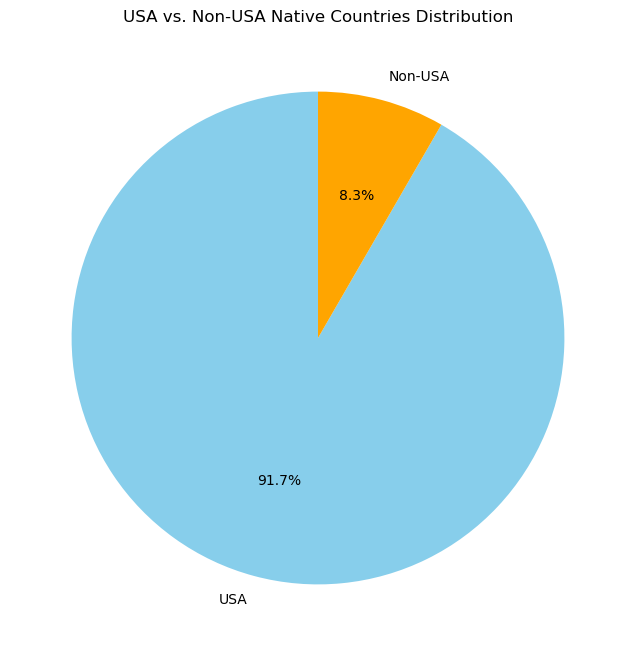

In [201]:
plt.figure(figsize=(8, 8))
plt.pie(
    country_group_distribution,
    labels=country_group_distribution.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=["skyblue", "orange"],  
)
plt.title("USA vs. Non-USA Native Countries Distribution")
plt.show()

In [203]:
adult

,Age,Workclass,Fnlwgt,Education,Education_Num,Marital_Status,Occupation,Household_Role,Race,Gender,Capital_Gain,Capital_Loss,Hours_Per_Week,Native_Country,Income,Country_Group
0,30,Private,77266,HS-grad,9,Divorced,Transport-moving,Not-in-family,White,Male,0,0,55,United-States,<=50K,USA
1,26,Private,191648,Assoc-acdm,12,Never-married,Machine-op-inspct,Other-relative,White,Female,0,0,15,United-States,<=50K,USA
2,81,Private,120478,Assoc-voc,11,Divorced,Craft-repair,Unmarried,White,Female,0,0,1,United-States,<=50K,USA
3,32,Private,211349,10th,6,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,40,United-States,<=50K,USA
4,22,Private,203715,Some-college,10,Never-married,Adm-clerical,Own-child,White,Male,0,0,40,United-States,<=50K,USA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5028,55,Private,98361,Masters,14,Married-civ-spouse,Prof-specialty,Husband,White,Male,15024,0,50,United-States,>50K,USA
5029,38,Self-emp-not-inc,322143,Bachelors,13,Married-civ-spouse,Other-service,Husband,White,Male,0,0,10,United-States,<=50K,USA
5030,33,Private,149184,HS-grad,9,Never-married,Prof-specialty,Not-in-family,White,Male,0,0,60,United-States,>50K,USA
5031,33,Local-gov,119829,HS-grad,9,Married-civ-spouse,Adm-clerical,Wife,White,Female,0,0,60,United-States,<=50K,USA


In [205]:
placeholder_values = ["?", "Unknown", "NA", "NaN", "null", ""]

In [207]:
for column in adult.columns:
    print(f"Checking column: {column}")

    num_nan = adult[column].isnull().sum()
    if num_nan > 0:
        print(f"   - Number of NaN values: {num_nan}")    
    
    num_placeholders = adult[column].isin(placeholder_values).sum()
    if num_placeholders > 0:
        print(f"   - Number of placeholder values ({placeholder_values}): {num_placeholders}")

    print()  

Checking column: Age

Checking column: Workclass

Checking column: Fnlwgt

Checking column: Education

Checking column: Education_Num

Checking column: Marital_Status

Checking column: Occupation

Checking column: Household_Role

Checking column: Race

Checking column: Gender

Checking column: Capital_Gain

Checking column: Capital_Loss

Checking column: Hours_Per_Week

Checking column: Native_Country

Checking column: Income

Checking column: Country_Group



In [209]:
adult.head()

,Age,Workclass,Fnlwgt,Education,Education_Num,Marital_Status,Occupation,Household_Role,Race,Gender,Capital_Gain,Capital_Loss,Hours_Per_Week,Native_Country,Income,Country_Group
0,30,Private,77266,HS-grad,9,Divorced,Transport-moving,Not-in-family,White,Male,0,0,55,United-States,<=50K,USA
1,26,Private,191648,Assoc-acdm,12,Never-married,Machine-op-inspct,Other-relative,White,Female,0,0,15,United-States,<=50K,USA
2,81,Private,120478,Assoc-voc,11,Divorced,Craft-repair,Unmarried,White,Female,0,0,1,United-States,<=50K,USA
3,32,Private,211349,10th,6,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,40,United-States,<=50K,USA
4,22,Private,203715,Some-college,10,Never-married,Adm-clerical,Own-child,White,Male,0,0,40,United-States,<=50K,USA


In [211]:
adult.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5033 entries, 0 to 5032
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             5033 non-null   int64 
 1   Workclass       5033 non-null   object
 2   Fnlwgt          5033 non-null   int64 
 3   Education       5033 non-null   object
 4   Education_Num   5033 non-null   int64 
 5   Marital_Status  5033 non-null   object
 6   Occupation      5033 non-null   object
 7   Household_Role  5033 non-null   object
 8   Race            5033 non-null   object
 9   Gender          5033 non-null   object
 10  Capital_Gain    5033 non-null   int64 
 11  Capital_Loss    5033 non-null   int64 
 12  Hours_Per_Week  5033 non-null   int64 
 13  Native_Country  5033 non-null   object
 14  Income          5033 non-null   object
 15  Country_Group   5033 non-null   object
dtypes: int64(6), object(10)
memory usage: 629.3+ KB


In [213]:
adult.describe()

,Age,Fnlwgt,Education_Num,Capital_Gain,Capital_Loss,Hours_Per_Week
count,5033.000000,5.033000e+03,5033.000000,5033.000000,5033.000000,5033.000000
mean,38.623684,1.877222e+05,10.093781,973.050467,91.350685,40.425392
std,13.424887,1.041220e+05,2.562406,6975.581829,409.989866,12.304289
min,17.000000,1.930200e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.158310e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.762700e+05,10.000000,0.000000,0.000000,40.000000
75%,47.000000,2.371410e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.033222e+06,16.000000,99999.000000,3683.000000,99.000000


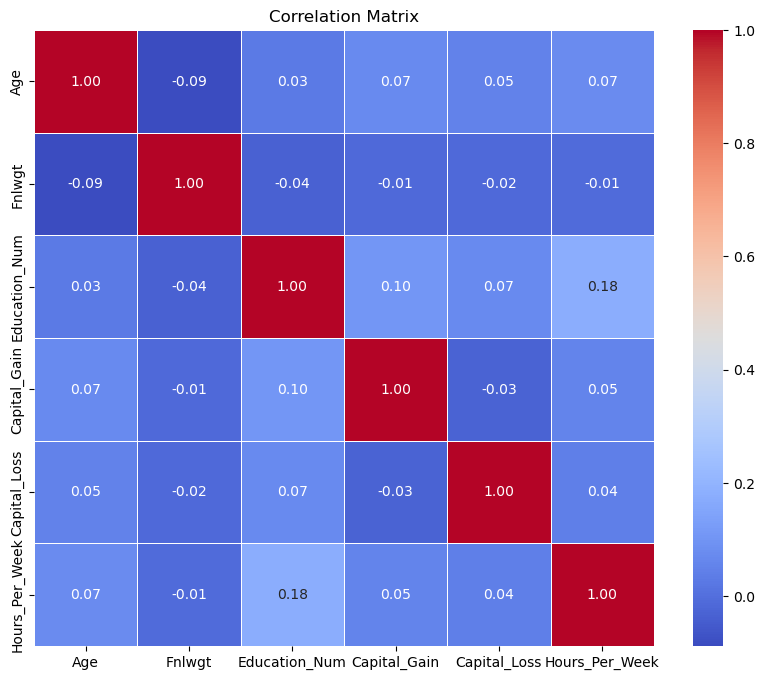

In [215]:
numerical_data = adult.select_dtypes(include=['float64', 'int64'])

plt.figure(figsize=(10, 8))
sns.heatmap(numerical_data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

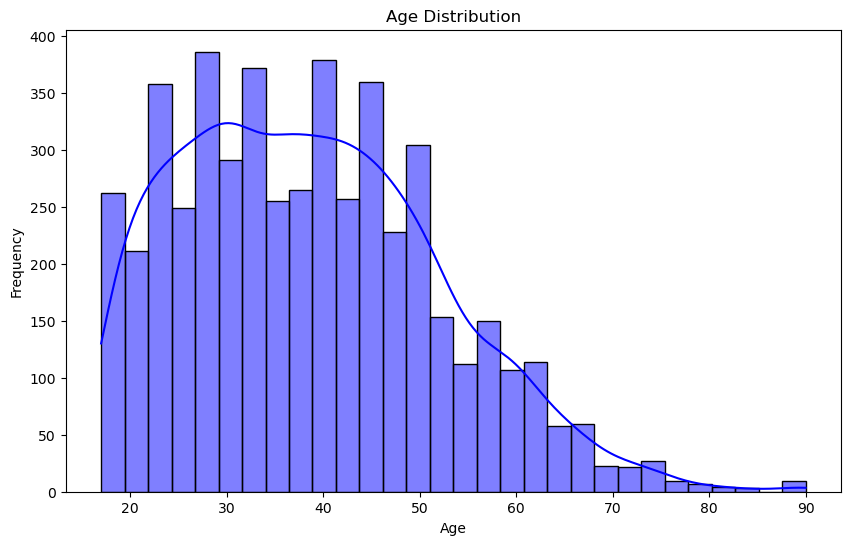

In [217]:
plt.figure(figsize=(10, 6))
sns.histplot(adult['Age'], kde=True, color='blue', bins=30)
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

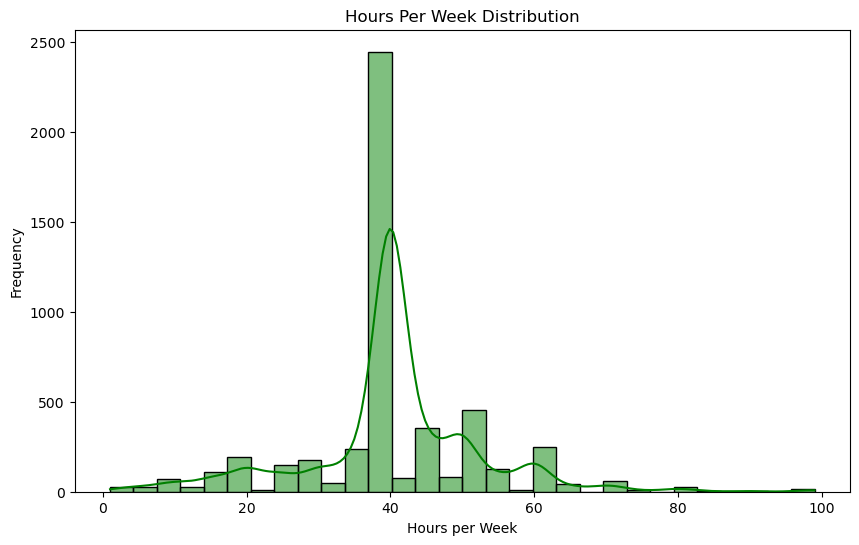

In [219]:
plt.figure(figsize=(10, 6))
sns.histplot(adult['Hours_Per_Week'], kde=True, color='green', bins=30)
plt.title('Hours Per Week Distribution')
plt.xlabel('Hours per Week')
plt.ylabel('Frequency')
plt.show()

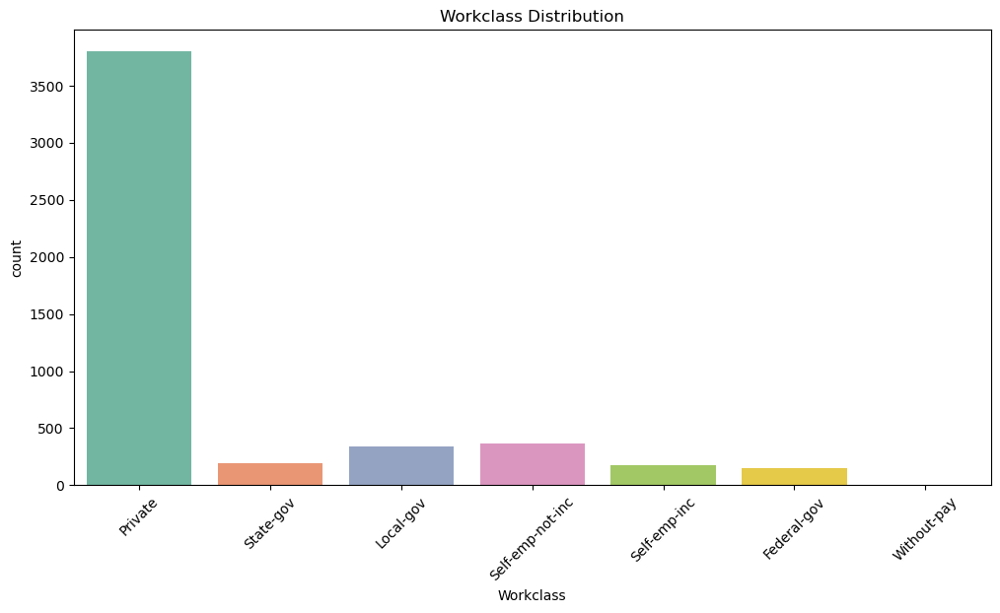

In [382]:
plt.figure(figsize=(12, 6))
sns.countplot(data=adult, x='Workclass', palette='Set2', hue='Workclass')
plt.title('Workclass Distribution')
plt.xticks(rotation=45)
plt.show()

<Figure size 1200x600 with 0 Axes>

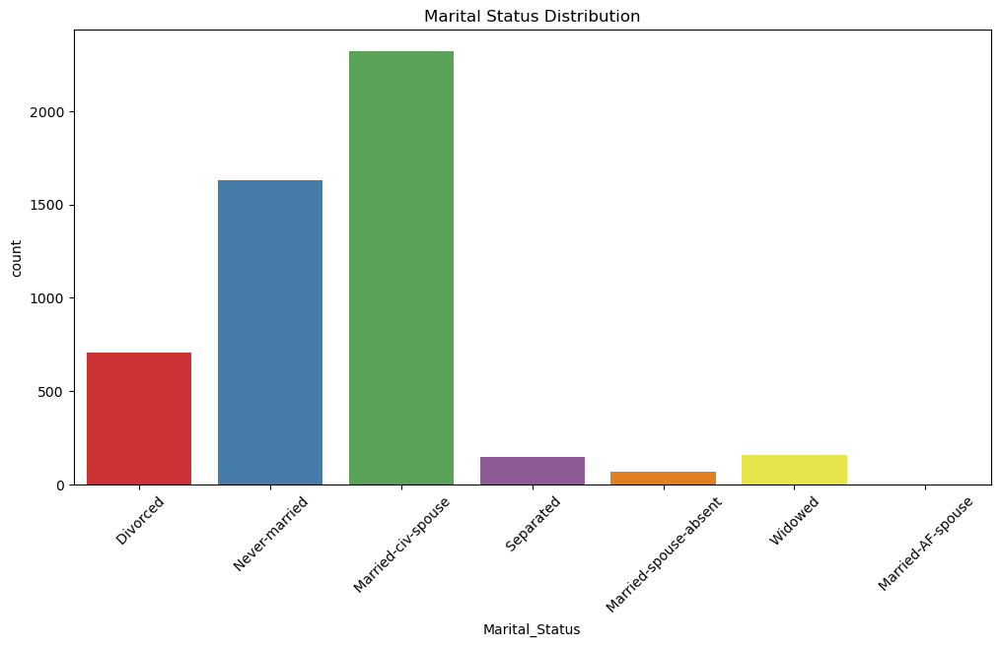

In [380]:
plt.figure(figsize=(12, 6))
sns.countplot(data=adult, x='Marital_Status', hue='Marital_Status', palette='Set1')
plt.title('Marital Status Distribution')
plt.xticks(rotation=45)
plt.show()

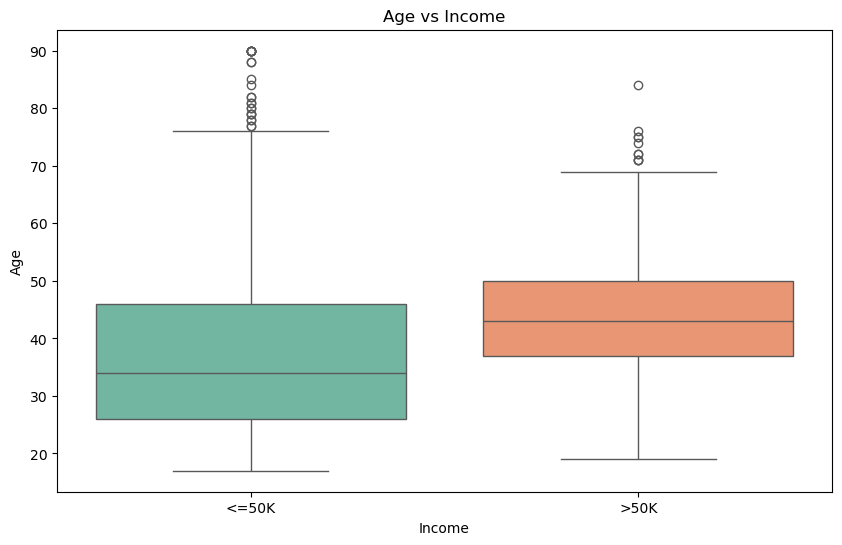

In [374]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Income', y='Age', data=adult,  hue='Income', palette='Set2')
plt.title('Age vs Income')
plt.show()

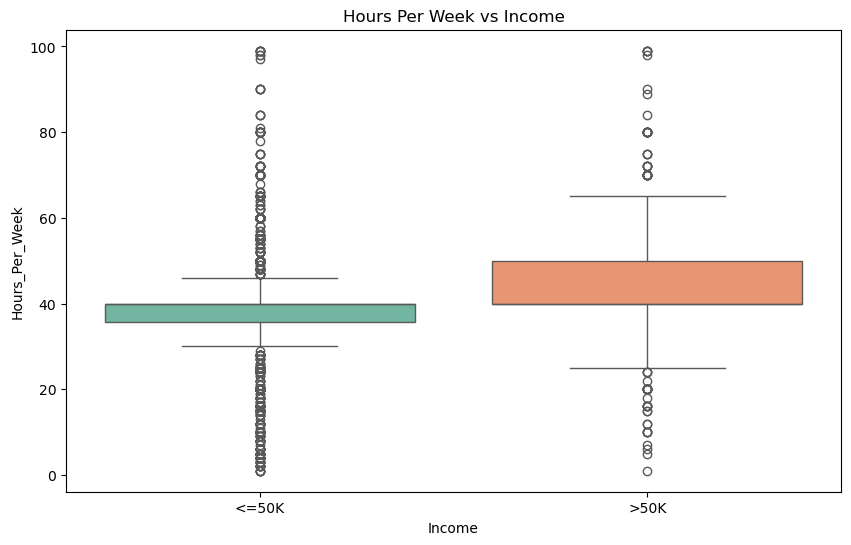

In [372]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Income', y='Hours_Per_Week', data=adult, hue='Income', palette='Set2')
plt.title('Hours Per Week vs Income')
plt.show()

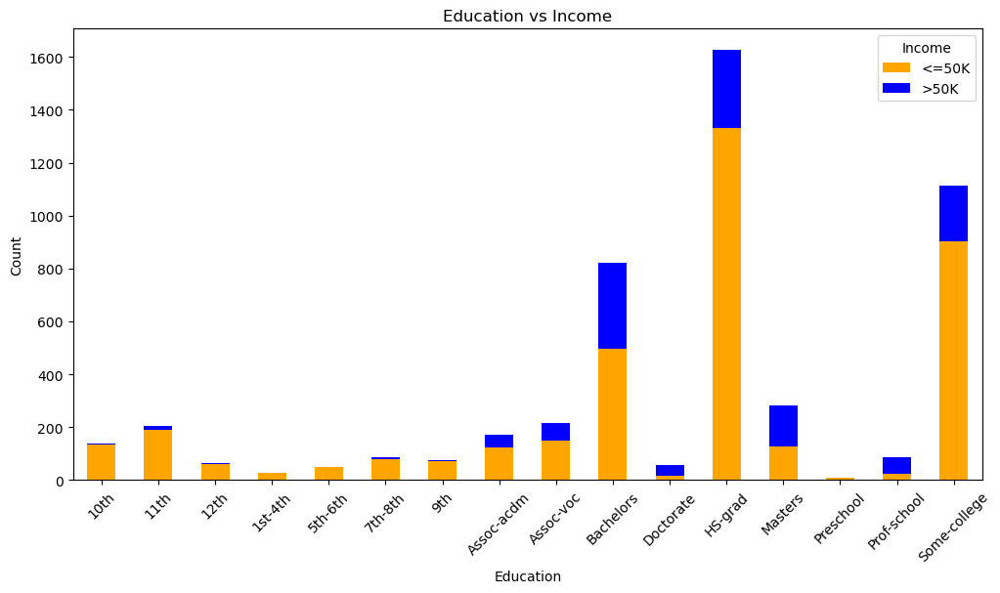

In [370]:
education_income = adult.groupby(['Education', 'Income']).size().unstack()

education_income.plot(kind='bar', stacked=True, figsize=(12, 6), color=['orange', 'blue'])
plt.title('Education vs Income')
plt.xlabel('Education')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Income')
plt.show()


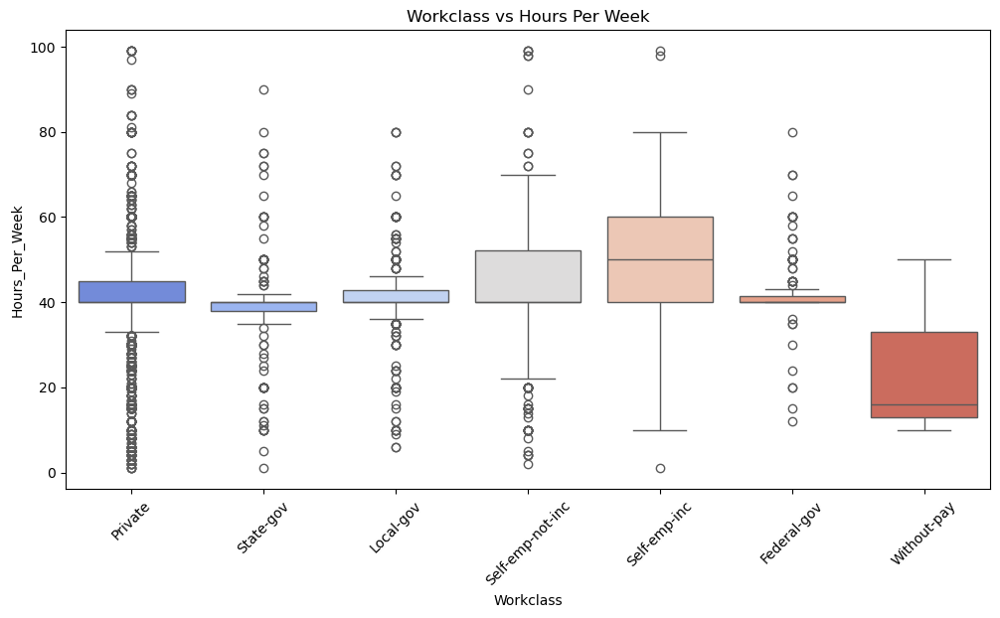

In [364]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=adult, x='Workclass', y='Hours_Per_Week', hue='Workclass', palette='coolwarm')
plt.xticks(rotation=45)
plt.title('Workclass vs Hours Per Week')
plt.show()

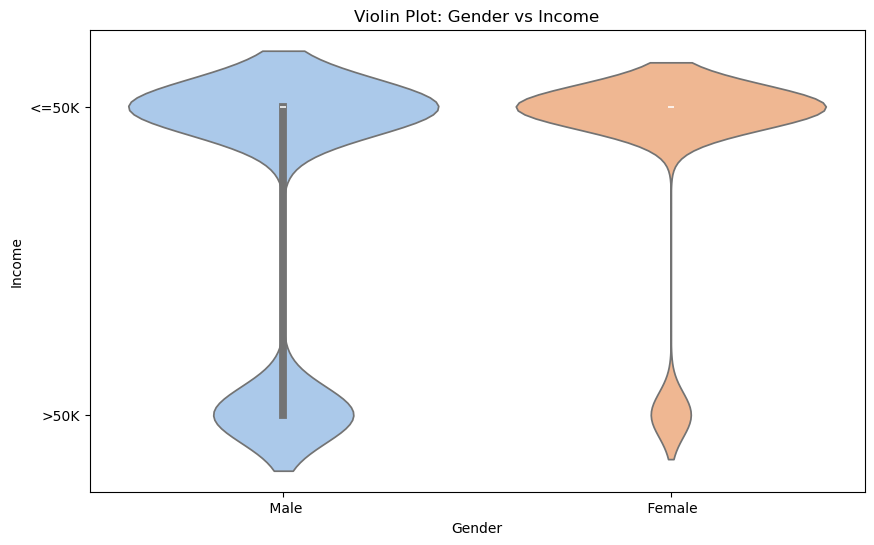

In [362]:
plt.figure(figsize=(10, 6))
sns.violinplot(data=adult, x='Gender', y='Income', hue='Gender', palette='pastel')
plt.title('Violin Plot: Gender vs Income')
plt.show()


<Figure size 1200x600 with 0 Axes>

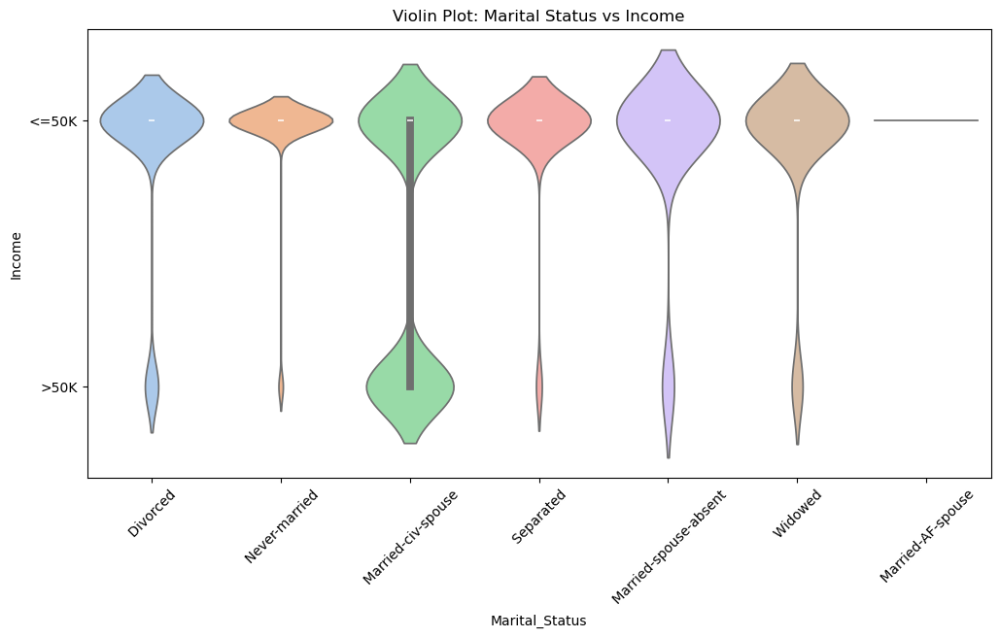

In [360]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=adult, x='Marital_Status', y='Income', hue='Marital_Status', palette='pastel')
plt.title('Violin Plot: Marital Status vs Income')
plt.xticks(rotation=45)
plt.show()

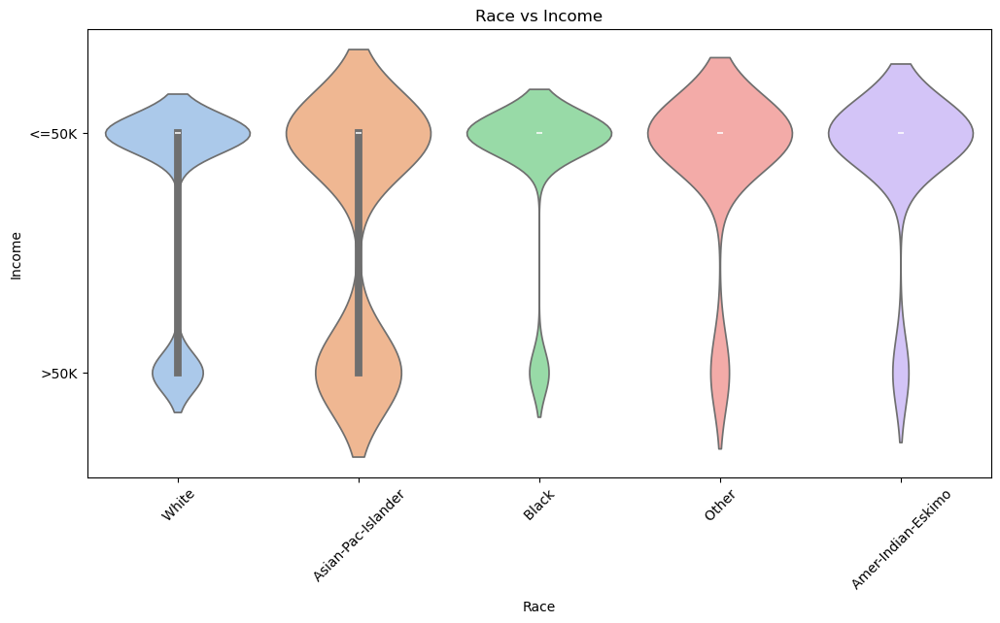

In [354]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=adult, x='Race', y='Income', hue='Race', palette='pastel')
plt.xticks(rotation=45)
plt.title('Race vs Income')
plt.show()


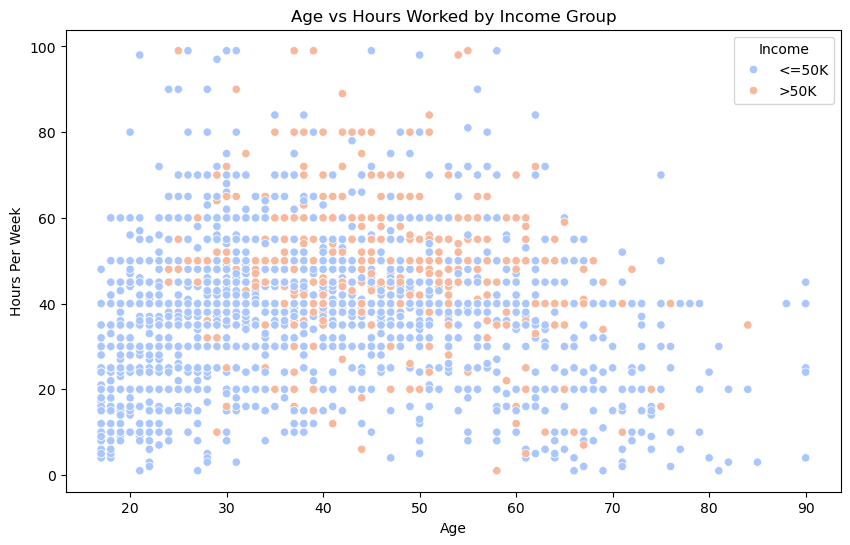

In [336]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=adult, x='Age', y='Hours_Per_Week', hue='Income', palette='coolwarm')
plt.title('Age vs Hours Worked by Income Group')
plt.xlabel('Age')
plt.ylabel('Hours Per Week')
plt.legend(title='Income')
plt.show()


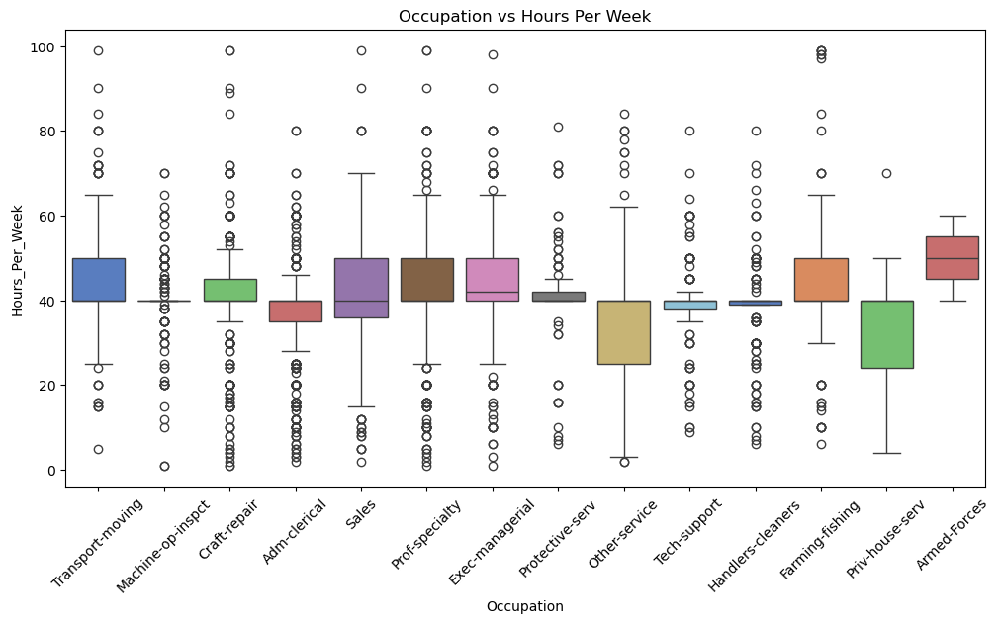

In [338]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=adult, x='Occupation', y='Hours_Per_Week', hue="Occupation", palette='muted')
plt.xticks(rotation=45)
plt.title('Occupation vs Hours Per Week')
plt.show()


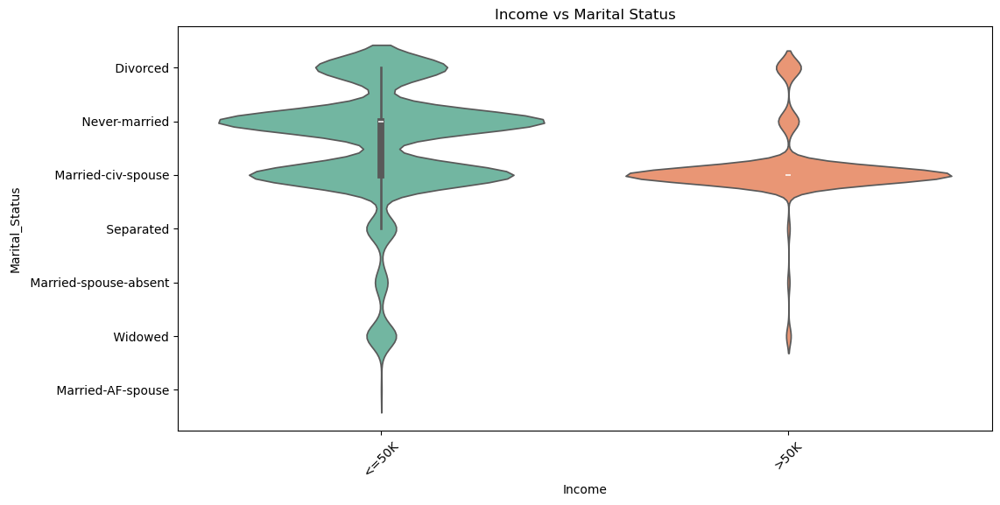

In [340]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=adult, x='Income', y='Marital_Status', hue="Income", palette='Set2')
plt.xticks(rotation=45)
plt.title('Income vs Marital Status')
plt.show()

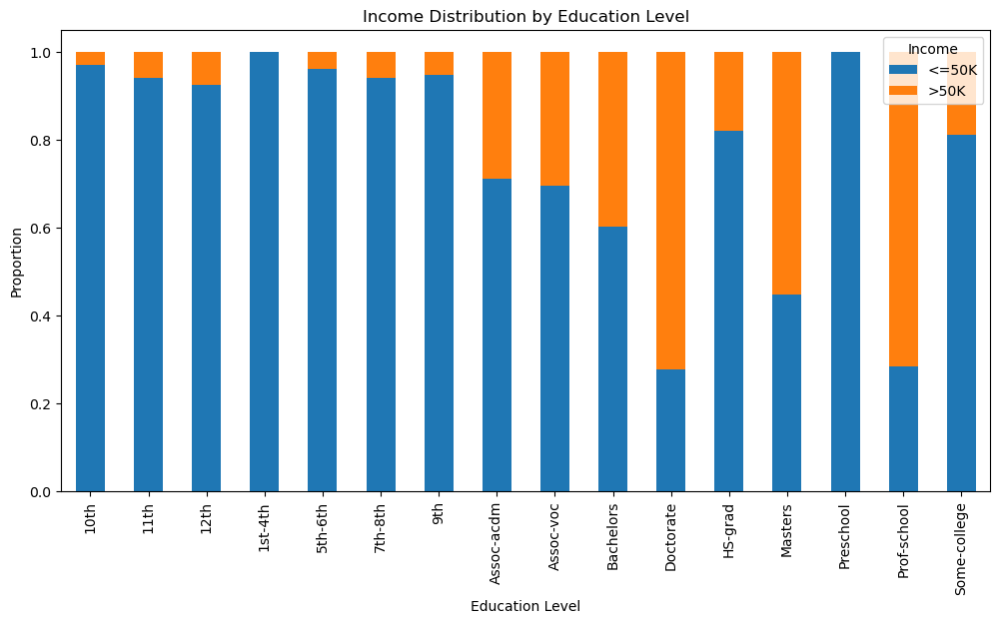

In [285]:
# Income Distribution by Education Level
education_income = adult.groupby('Education')['Income'].value_counts(normalize=True).unstack()
education_income.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Income Distribution by Education Level')
plt.xlabel('Education Level')
plt.ylabel('Proportion')
plt.legend(title='Income')
plt.show()

<Figure size 1000x600 with 0 Axes>

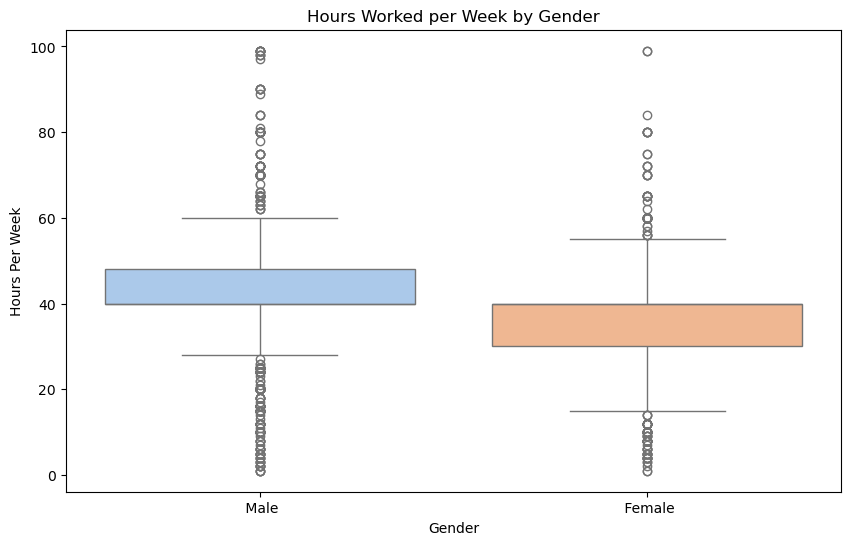

In [346]:
# Hours Worked per Week by Gender
plt.figure(figsize=(10, 6))
sns.boxplot(data=adult, x='Gender', y='Hours_Per_Week', hue='Gender', palette='pastel')
plt.title('Hours Worked per Week by Gender')
plt.xlabel('Gender')
plt.ylabel('Hours Per Week')
plt.show()

In [291]:
if 'Income' in adult.columns:
    income_distribution = adult['Income'].value_counts(normalize=True)
    print("Income Distribution:")
    print(income_distribution)

Income Distribution:
Income
<=50K    0.753427
>50K     0.246573
Name: proportion, dtype: float64


In [297]:
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import plotly.express as px

In [305]:
# Hypothesis Testing: Is there a significant difference in Hours_Per_Week based on Income groups?
income_groups = adult[['Income', 'Hours_Per_Week']].dropna()
low_income = income_groups[income_groups['Income'] == '<=50K']['Hours_Per_Week']
high_income = income_groups[income_groups['Income'] == '>50K']['Hours_Per_Week']

# Perform T-test
t_stat, p_value, df = sm.stats.ttest_ind(low_income, high_income)

print(f"T-statistic: {t_stat}, P-value: {p_value}, Degrees of Freedom: {df}")
if p_value < 0.05:
    print("The difference in Hours_Per_Week between income groups is statistically significant.")
else:
    print("No significant difference in Hours_Per_Week between income groups.")


T-statistic: -16.534519838904867, P-value: 7.661947571763355e-60, Degrees of Freedom: 5031.0
The difference in Hours_Per_Week between income groups is statistically significant.


In [307]:
# Logistic Regression: Predict Income based on Age, Hours_Per_Week, and Education_Num
features = ['Age', 'Hours_Per_Week', 'Education_Num']
target = 'Income'
X = adult[features].dropna()
y = (adult[target] == '>50K').astype(int)  # Binary encoding

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train Logistic Regression Model
model = LogisticRegression()
model.fit(X_train, y_train)

# Model Evaluation
y_pred = model.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.93      0.86      1148
           1       0.56      0.29      0.39       362

    accuracy                           0.78      1510
   macro avg       0.69      0.61      0.62      1510
weighted avg       0.75      0.78      0.75      1510

Confusion Matrix:
[[1066   82]
 [ 256  106]]


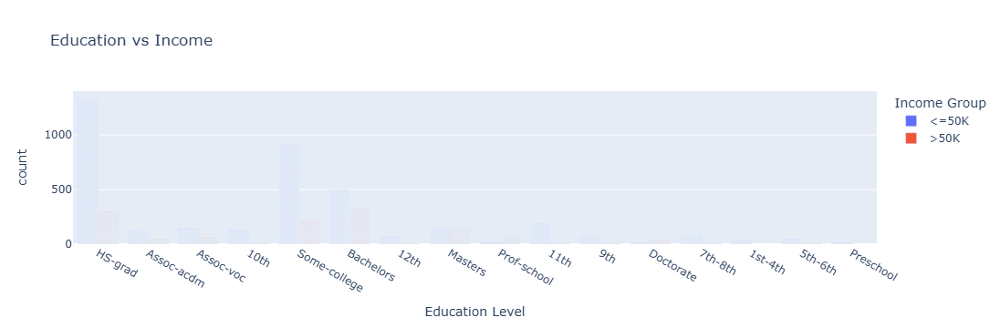

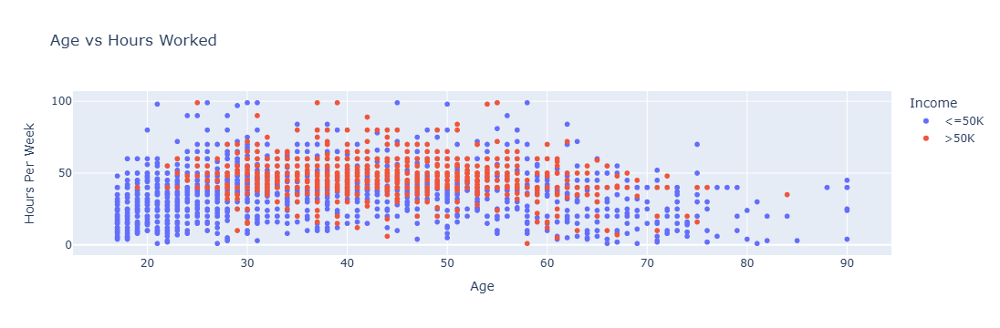

In [311]:
# Interactive Visualization: Education vs. Income using Plotly
fig = px.bar(data_frame=adult, x='Education', color='Income', barmode='group', 
             title='Education vs Income', labels={'Income': 'Income Group', 'Education': 'Education Level'})
fig.show()

# Interactive Scatter Plot: Age vs Hours Worked colored by Income
fig = px.scatter(data_frame=adult, x='Age', y='Hours_Per_Week', color='Income',
                 title='Age vs Hours Worked', labels={'Hours_Per_Week': 'Hours Per Week', 'Age': 'Age'})
fig.show()


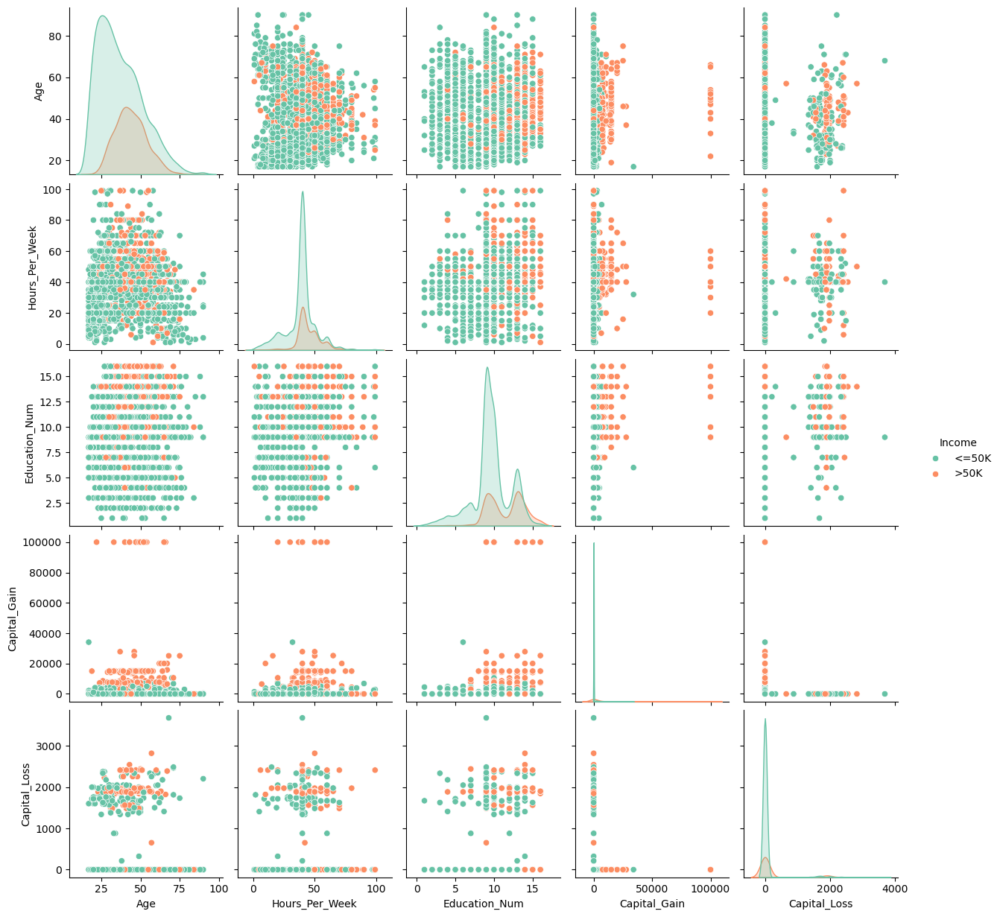

In [315]:
# Pairplot for selected features
selected_features = ['Age', 'Hours_Per_Week', 'Education_Num', 'Capital_Gain', 'Capital_Loss']
sns.pairplot(adult[selected_features + ['Income']], hue='Income', palette='Set2', diag_kind='kde')
plt.show()

# This provides an overview of distributions and relationships between features. 
# Notable separations in distributions can guide classification tasks.
    

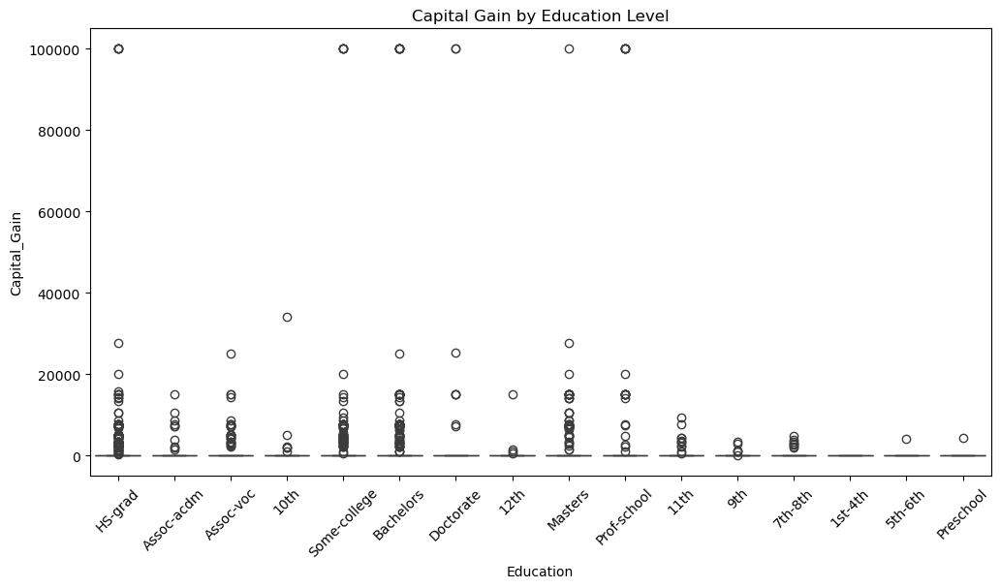

In [348]:
# Boxplot: Capital_Gain vs. Education
plt.figure(figsize=(12, 6))
sns.boxplot(data=adult, x='Education', y='Capital_Gain', hue="Education", palette='muted')
plt.xticks(rotation=45)
plt.title('Capital Gain by Education Level')
plt.show()

# Observations from this can highlight financial trends linked to education, 

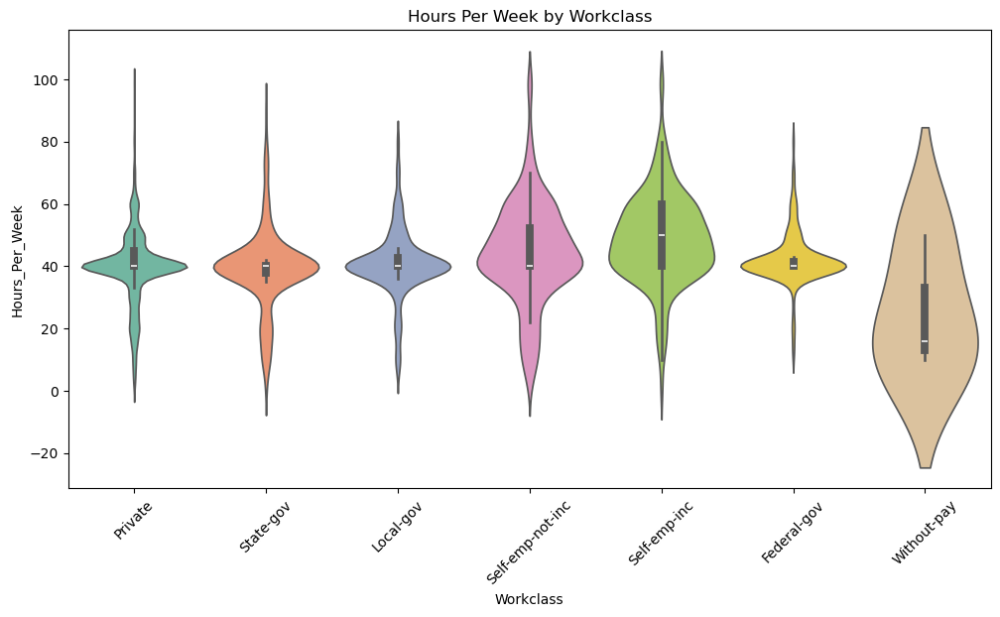

In [350]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=adult, x='Workclass', y='Hours_Per_Week', hue="Workclass", palette='Set2')
plt.xticks(rotation=45)
plt.title('Hours Per Week by Workclass')
plt.show()
# The distribution of working hours for different work classes shows variation in work expectations.

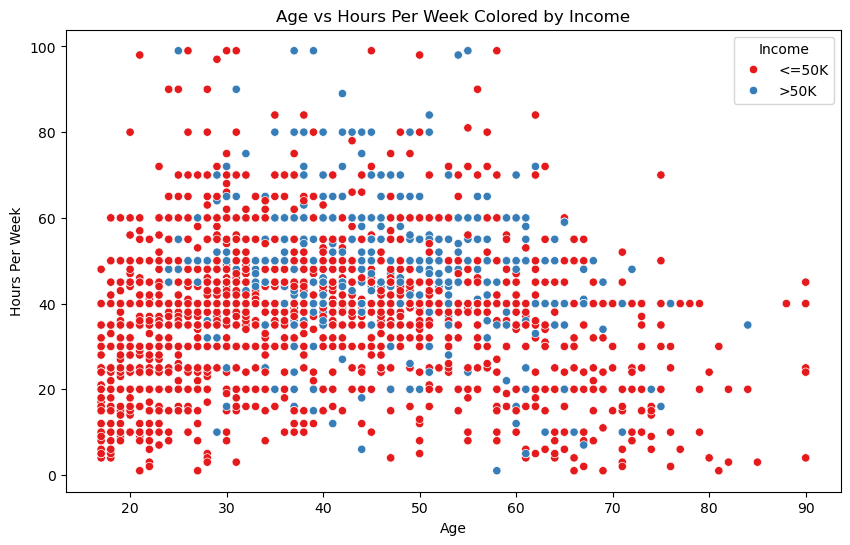

In [328]:

# Scatterplot for Age vs Hours Per Week
plt.figure(figsize=(10, 6))
sns.scatterplot(data=adult, x='Age', y='Hours_Per_Week', hue='Income', palette='Set1')
plt.title('Age vs Hours Per Week Colored by Income')
plt.xlabel('Age')
plt.ylabel('Hours Per Week')
plt.show()

# This scatterplot reveals if certain age groups work more hours and how income groups differ in working hours.
    

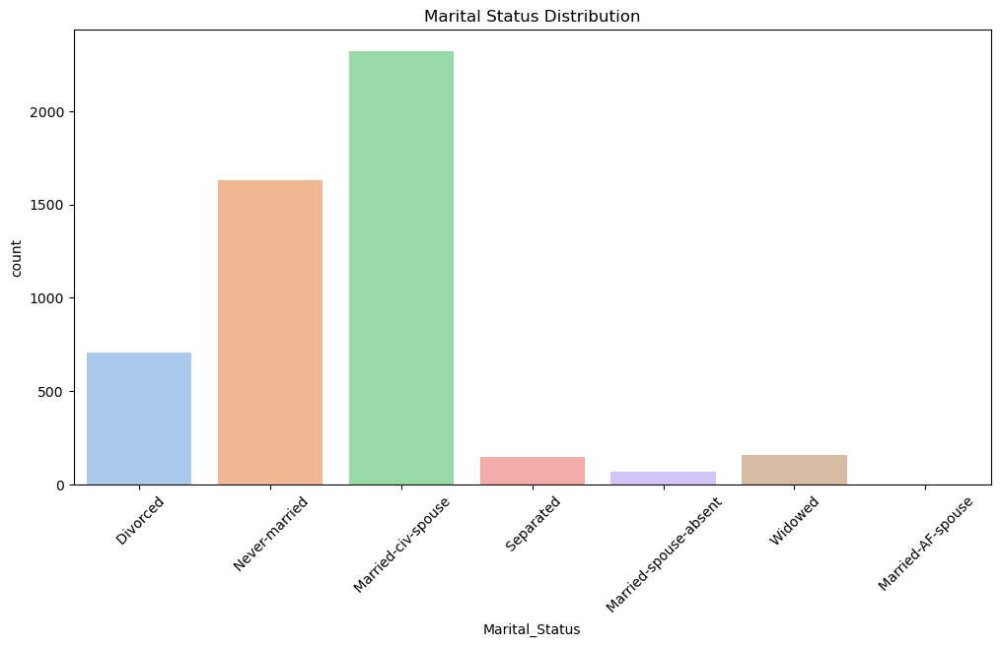

In [352]:
# Count plot for Marital Status
plt.figure(figsize=(12, 6))
sns.countplot(data=adult, x='Marital_Status', palette='pastel', hue='Marital_Status')
plt.xticks(rotation=45)
plt.title('Marital Status Distribution')
plt.show()

# Analyzing marital status distribution helps in understanding demographic trends within the dataset.
    

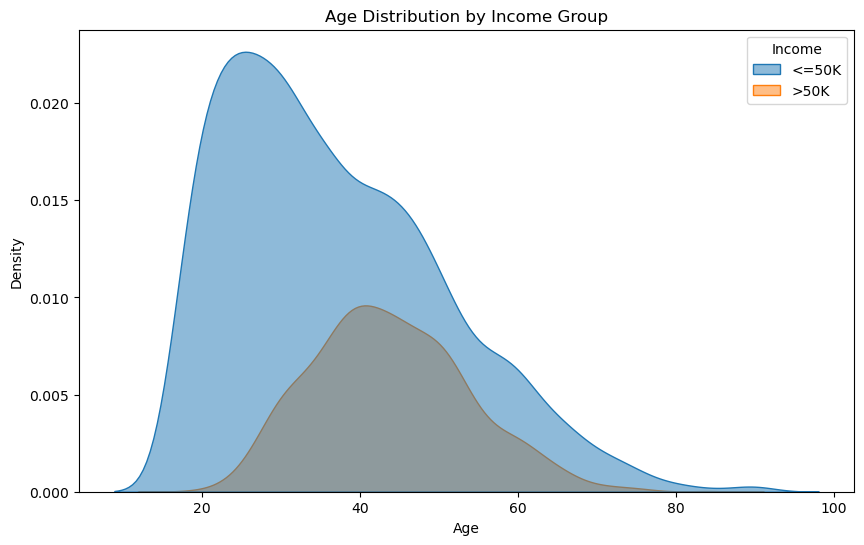

In [332]:
# KDE Plot for Age Distribution by Income
plt.figure(figsize=(10, 6))
sns.kdeplot(data=adult, x='Age', hue='Income', fill=True, alpha=0.5)
plt.title('Age Distribution by Income Group')
plt.xlabel('Age')
plt.ylabel('Density')
plt.show()

# This shows overlapping age distributions for different income groups, indicating age trends for income disparity.
    

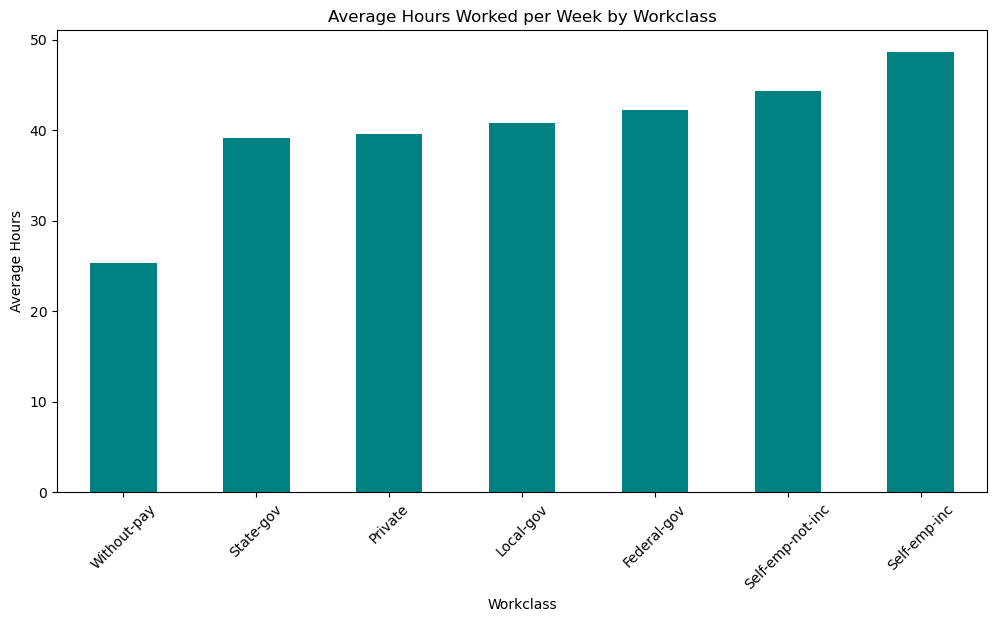

In [334]:
# Bar Plot for Workclass vs Average Hours Worked
workclass_hours = adult.groupby('Workclass')['Hours_Per_Week'].mean().sort_values()
plt.figure(figsize=(12, 6))
workclass_hours.plot(kind='bar', color='teal')
plt.title('Average Hours Worked per Week by Workclass')
plt.xlabel('Workclass')
plt.ylabel('Average Hours')
plt.xticks(rotation=45)
plt.show()

#This highlights how different job classes allocate working hours, 
# which can guide policy-making or labor analysis.
    

In [400]:
adult['Income_Binary'] = (adult['Income'] == '>50K').astype(int)  # Convert Income to binary (1 for >50K, 0 otherwise)

In [404]:
adult.head()

,Age,Workclass,Fnlwgt,Education,Education_Num,Marital_Status,Occupation,Household_Role,Race,Gender,Capital_Gain,Capital_Loss,Hours_Per_Week,Native_Country,Income,Country_Group,Income_Binary
0,30,Private,77266,HS-grad,9,Divorced,Transport-moving,Not-in-family,White,Male,0,0,55,United-States,<=50K,USA,0
1,26,Private,191648,Assoc-acdm,12,Never-married,Machine-op-inspct,Other-relative,White,Female,0,0,15,United-States,<=50K,USA,0
2,81,Private,120478,Assoc-voc,11,Divorced,Craft-repair,Unmarried,White,Female,0,0,1,United-States,<=50K,USA,0
3,32,Private,211349,10th,6,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,40,United-States,<=50K,USA,0
4,22,Private,203715,Some-college,10,Never-married,Adm-clerical,Own-child,White,Male,0,0,40,United-States,<=50K,USA,0


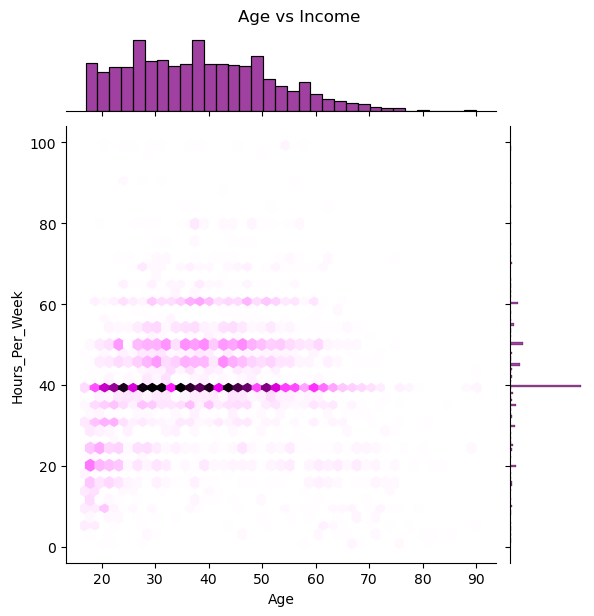

In [421]:
sns.jointplot( x='Age', y='Hours_Per_Week', data=adult, kind='hex', color='purple')
plt.suptitle('Age vs Income', y=1.02)
plt.show()

In [412]:
adult.head()

,Age,Workclass,Fnlwgt,Education,Education_Num,Marital_Status,Occupation,Household_Role,Race,Gender,Capital_Gain,Capital_Loss,Hours_Per_Week,Native_Country,Income,Country_Group,Income_Binary
0,30,Private,77266,HS-grad,9,Divorced,Transport-moving,Not-in-family,White,Male,0,0,55,United-States,<=50K,USA,0
1,26,Private,191648,Assoc-acdm,12,Never-married,Machine-op-inspct,Other-relative,White,Female,0,0,15,United-States,<=50K,USA,0
2,81,Private,120478,Assoc-voc,11,Divorced,Craft-repair,Unmarried,White,Female,0,0,1,United-States,<=50K,USA,0
3,32,Private,211349,10th,6,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,40,United-States,<=50K,USA,0
4,22,Private,203715,Some-college,10,Never-married,Adm-clerical,Own-child,White,Male,0,0,40,United-States,<=50K,USA,0


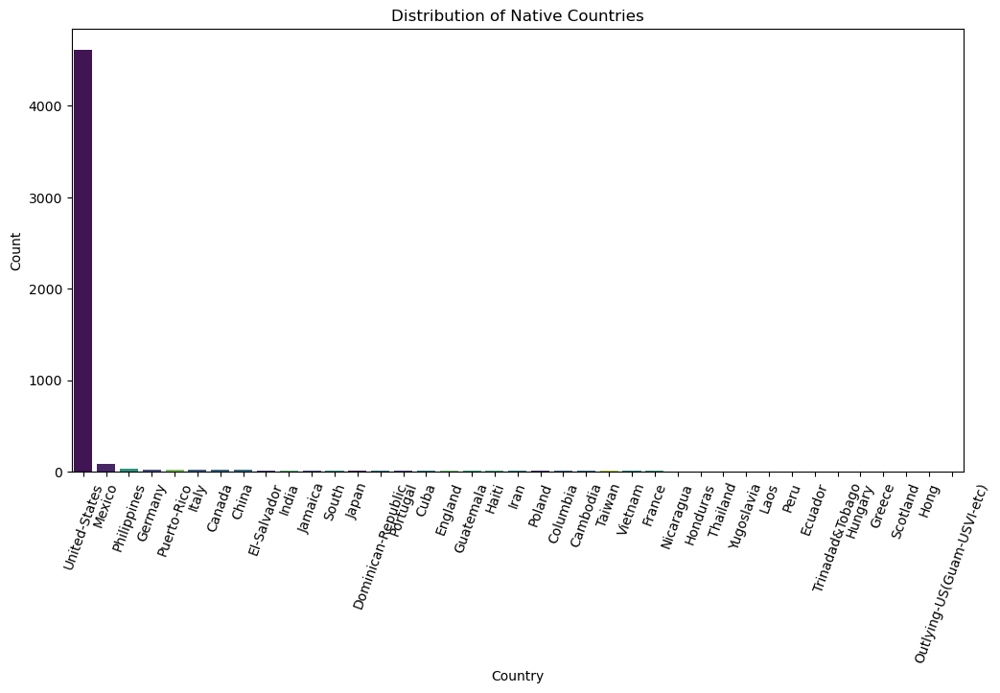

In [436]:

plt.figure(figsize=(12, 6))
sns.countplot(data=adult, x='Native_Country', order=adult['Native_Country'].value_counts().index, hue='Native_Country', palette='viridis')
plt.xticks(rotation=70)
plt.title('Distribution of Native Countries')
plt.xlabel('Country')
plt.ylabel('Count')
plt.show()


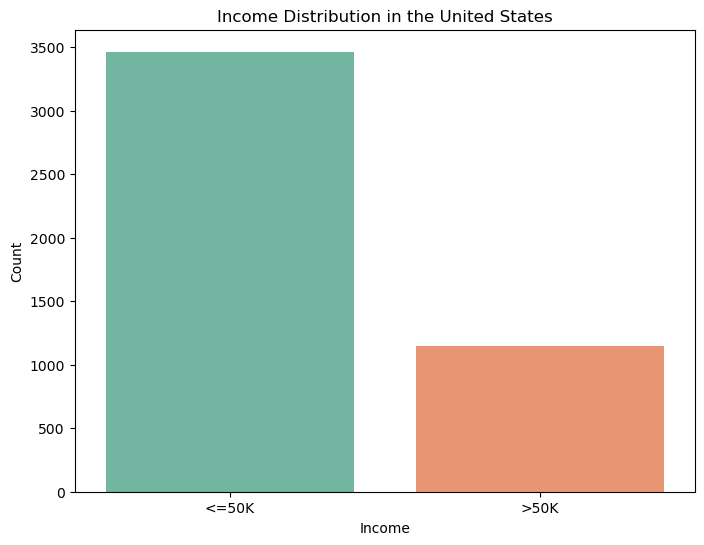

In [442]:
us_data = adult[adult['Native_Country'] == 'United-States']

plt.figure(figsize=(8, 6))
sns.countplot(data=us_data, x='Income', hue='Income', palette='Set2')
plt.title('Income Distribution in the United States')
plt.xlabel('Income')
plt.ylabel('Count')
plt.show()


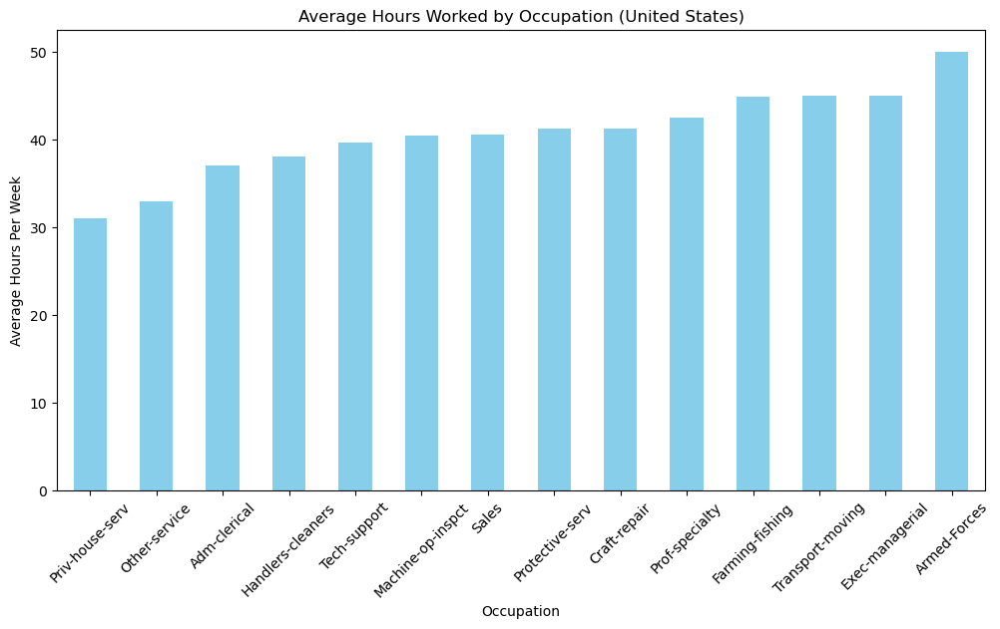

In [444]:
us_occupation_hours = us_data.groupby('Occupation')['Hours_Per_Week'].mean().sort_values()

plt.figure(figsize=(12, 6))
us_occupation_hours.plot(kind='bar', color='skyblue')
plt.title('Average Hours Worked by Occupation (United States)')
plt.xlabel('Occupation')
plt.ylabel('Average Hours Per Week')
plt.xticks(rotation=45)
plt.show()


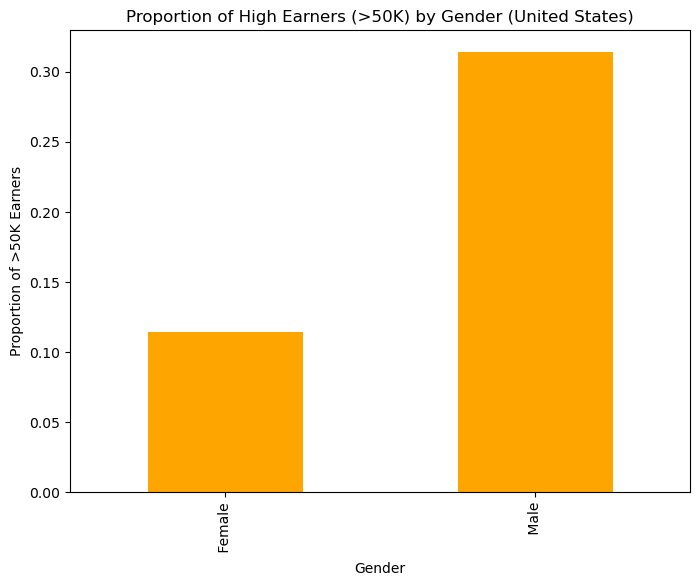

In [446]:
# Proportion of high earners by gender
us_gender_income = us_data.groupby('Gender')['Income_Binary'].mean()

# Plot
plt.figure(figsize=(8, 6))
us_gender_income.plot(kind='bar', color='orange')
plt.title('Proportion of High Earners (>50K) by Gender (United States)')
plt.xlabel('Gender')
plt.ylabel('Proportion of >50K Earners')
plt.show()


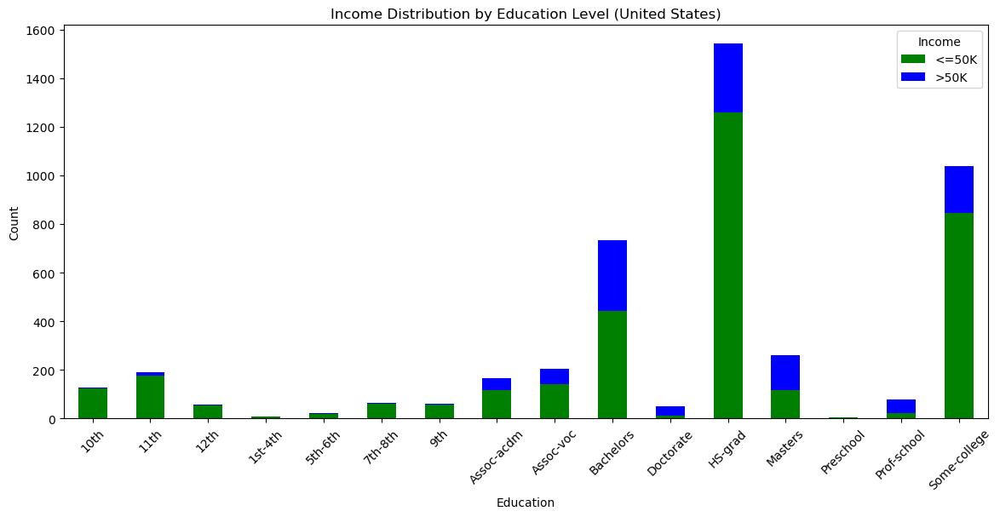

In [448]:
# Stacked bar chart for education vs income
us_education_income = us_data.groupby(['Education', 'Income']).size().unstack()

# Plot
us_education_income.plot(kind='bar', stacked=True, figsize=(14, 6), color=['green', 'blue'])
plt.title('Income Distribution by Education Level (United States)')
plt.xlabel('Education')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Income')
plt.show()


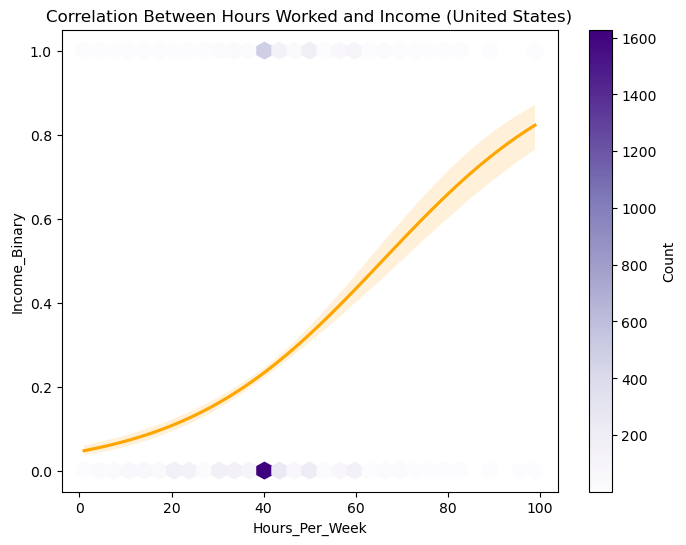

In [452]:
# Hexbin plot for Hours Worked and Income Binary
plt.figure(figsize=(8, 6))
hb = plt.hexbin(
    us_data['Hours_Per_Week'],
    us_data['Income_Binary'],
    gridsize=30,
    cmap='Purples',
    mincnt=1
)
plt.colorbar(hb, label='Count')
plt.title('Correlation Between Hours Worked and Income (United States)')
plt.xlabel('Hours Per Week')
plt.ylabel('Probability of Earning >50K')

# Overlay trend line
sns.regplot(
    data=us_data,
    x='Hours_Per_Week',
    y='Income_Binary',
    logistic=True,
    scatter=False,
    color='orange'
)
plt.show()

In [454]:
adult.head()

,Age,Workclass,Fnlwgt,Education,Education_Num,Marital_Status,Occupation,Household_Role,Race,Gender,Capital_Gain,Capital_Loss,Hours_Per_Week,Native_Country,Income,Country_Group,Income_Binary
0,30,Private,77266,HS-grad,9,Divorced,Transport-moving,Not-in-family,White,Male,0,0,55,United-States,<=50K,USA,0
1,26,Private,191648,Assoc-acdm,12,Never-married,Machine-op-inspct,Other-relative,White,Female,0,0,15,United-States,<=50K,USA,0
2,81,Private,120478,Assoc-voc,11,Divorced,Craft-repair,Unmarried,White,Female,0,0,1,United-States,<=50K,USA,0
3,32,Private,211349,10th,6,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,40,United-States,<=50K,USA,0
4,22,Private,203715,Some-college,10,Never-married,Adm-clerical,Own-child,White,Male,0,0,40,United-States,<=50K,USA,0


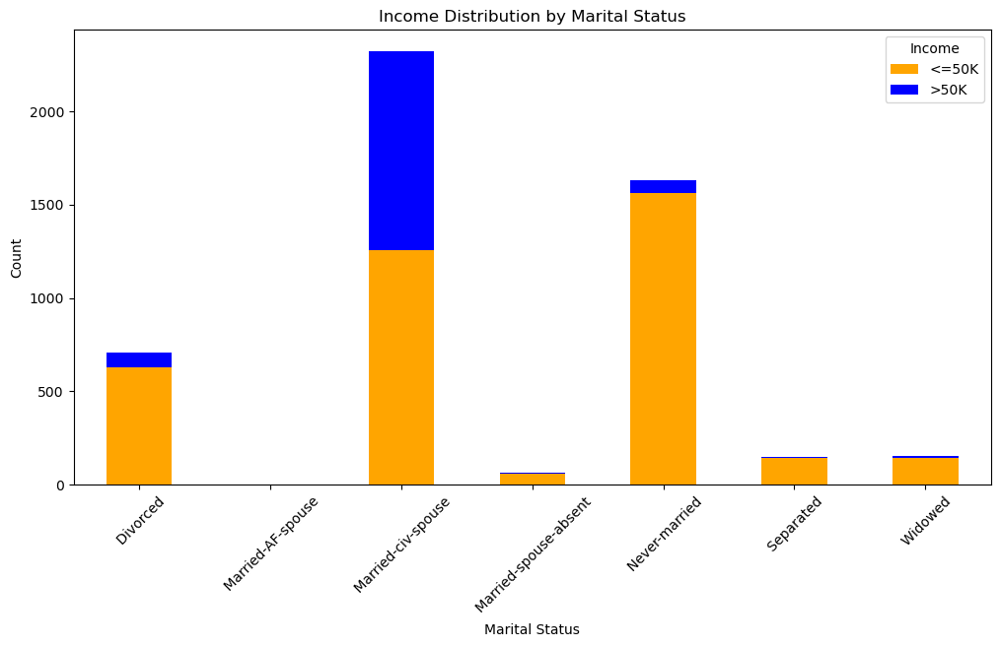

In [456]:
# Stacked bar chart for Income by Marital Status
marital_income = adult.groupby(['Marital_Status', 'Income']).size().unstack()

# Plot
marital_income.plot(kind='bar', stacked=True, figsize=(12, 6), color=['orange', 'blue'])
plt.title('Income Distribution by Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Income')
plt.show()


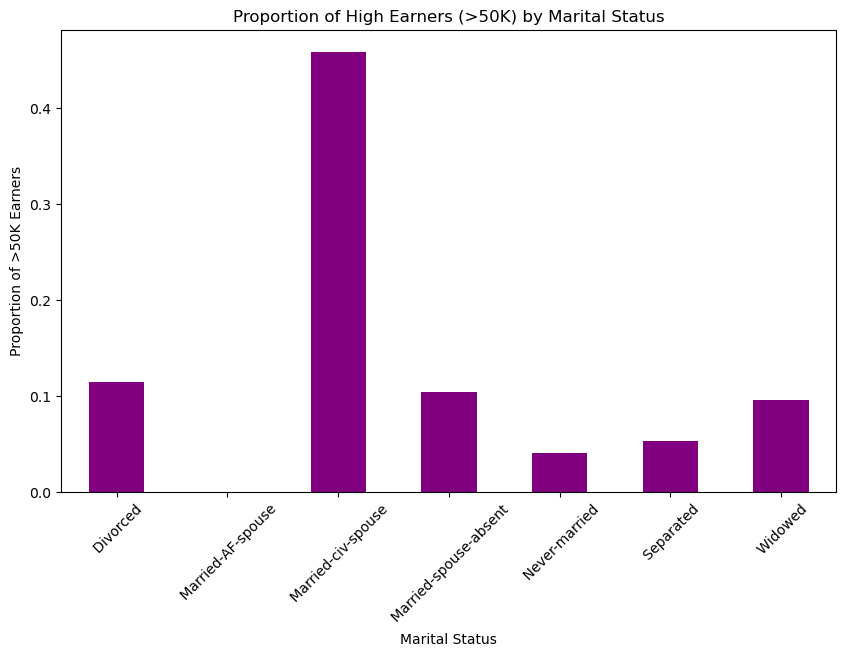

In [458]:
# Proportion of high earners by marital status
marital_high_income = adult.groupby('Marital_Status')['Income_Binary'].mean()

# Plot
plt.figure(figsize=(10, 6))
marital_high_income.plot(kind='bar', color='purple')
plt.title('Proportion of High Earners (>50K) by Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Proportion of >50K Earners')
plt.xticks(rotation=45)
plt.show()


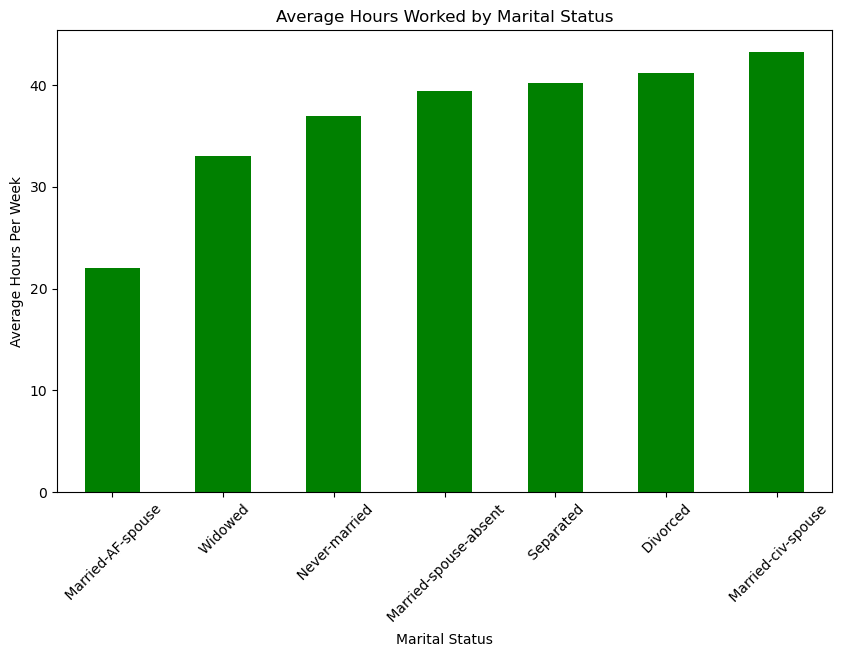

In [460]:
# Average hours worked by marital status
marital_hours = adult.groupby('Marital_Status')['Hours_Per_Week'].mean().sort_values()

# Plot
plt.figure(figsize=(10, 6))
marital_hours.plot(kind='bar', color='green')
plt.title('Average Hours Worked by Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Average Hours Per Week')
plt.xticks(rotation=45)
plt.show()


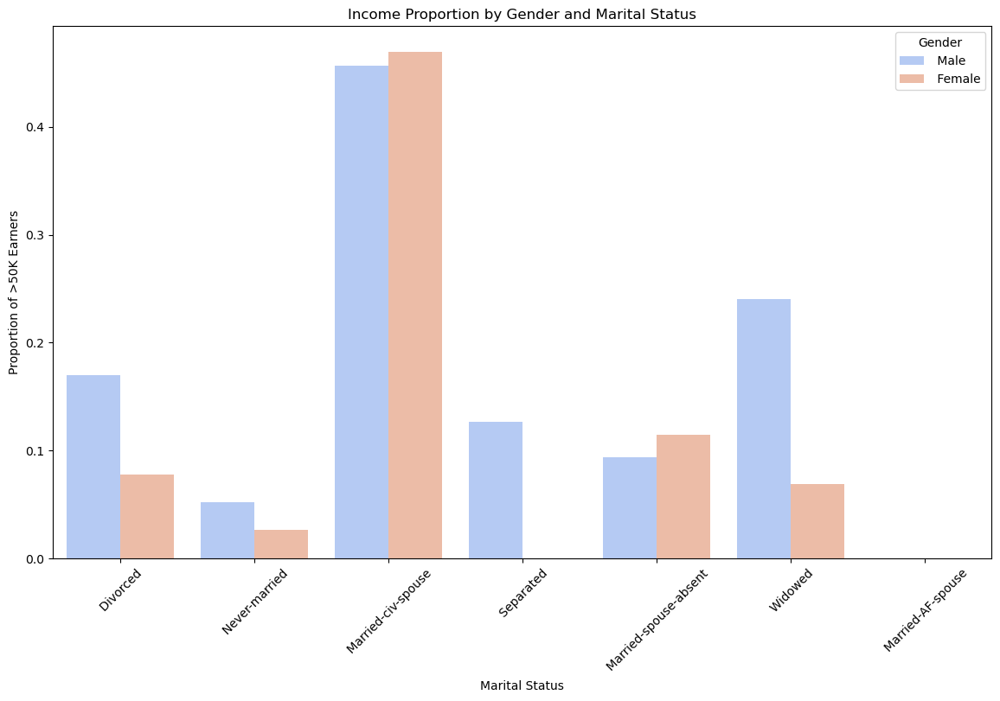

In [466]:
# Bar plot for gender and income by marital status
plt.figure(figsize=(14, 8))
sns.barplot(data=adult, x='Marital_Status', y='Income_Binary', hue='Gender', palette='coolwarm', errorbar=None)
plt.title('Income Proportion by Gender and Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Proportion of >50K Earners')
plt.xticks(rotation=45)
plt.legend(title='Gender')
plt.show()


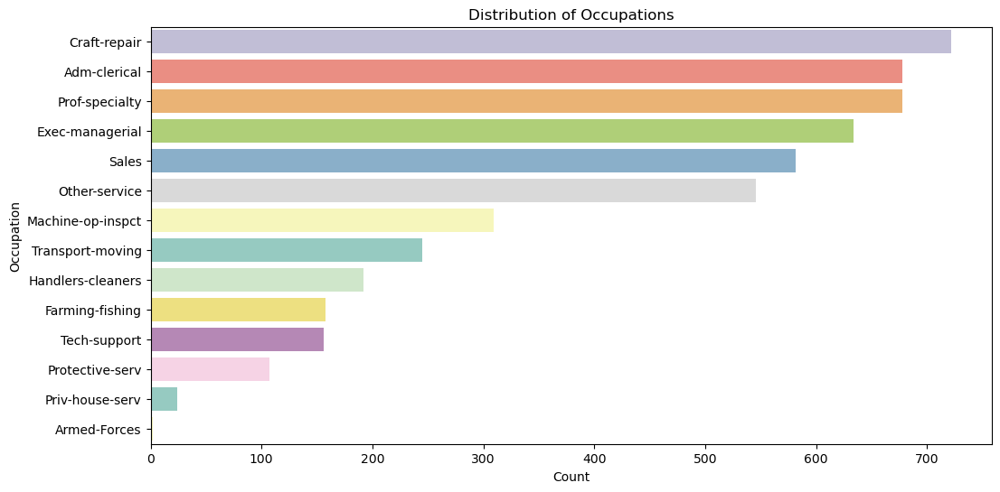

In [472]:
# Count plot for Occupation
plt.figure(figsize=(12, 6))
sns.countplot(data=adult, y='Occupation', hue='Occupation', palette='Set3', order=adult['Occupation'].value_counts().index)
plt.title('Distribution of Occupations')
plt.xlabel('Count')
plt.ylabel('Occupation')
plt.show()


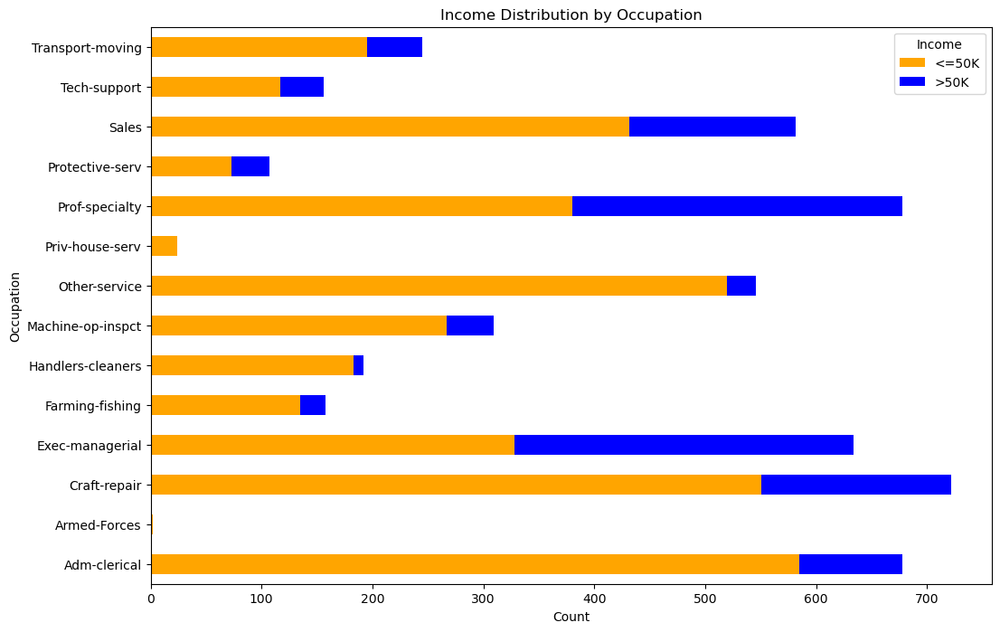

In [474]:
# Stacked bar chart for Income by Occupation
occupation_income = adult.groupby(['Occupation', 'Income']).size().unstack()

# Plot
occupation_income.plot(kind='barh', stacked=True, figsize=(12, 8), color=['orange', 'blue'])
plt.title('Income Distribution by Occupation')
plt.xlabel('Count')
plt.ylabel('Occupation')
plt.legend(title='Income')
plt.show()


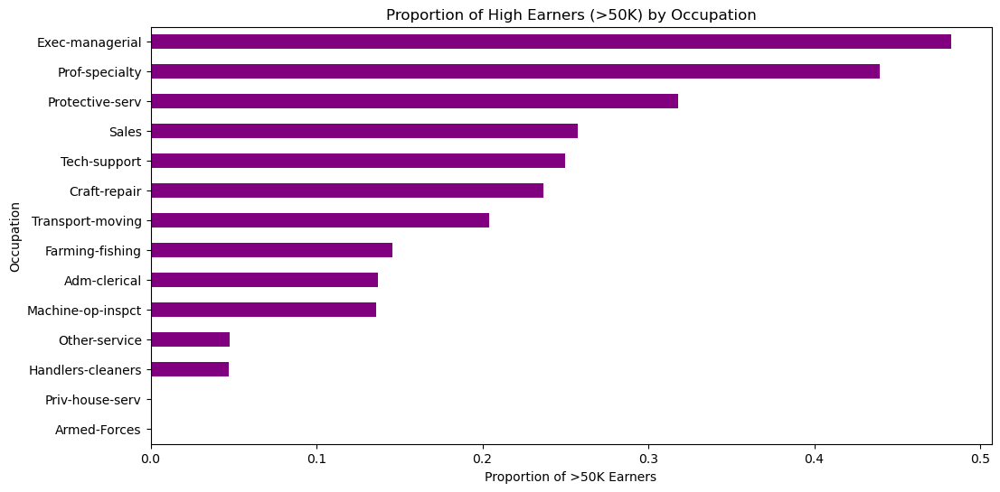

In [476]:
# Proportion of high earners by occupation
occupation_high_income = adult.groupby('Occupation')['Income_Binary'].mean().sort_values()

# Plot
plt.figure(figsize=(12, 6))
occupation_high_income.plot(kind='barh', color='purple')
plt.title('Proportion of High Earners (>50K) by Occupation')
plt.xlabel('Proportion of >50K Earners')
plt.ylabel('Occupation')
plt.show()


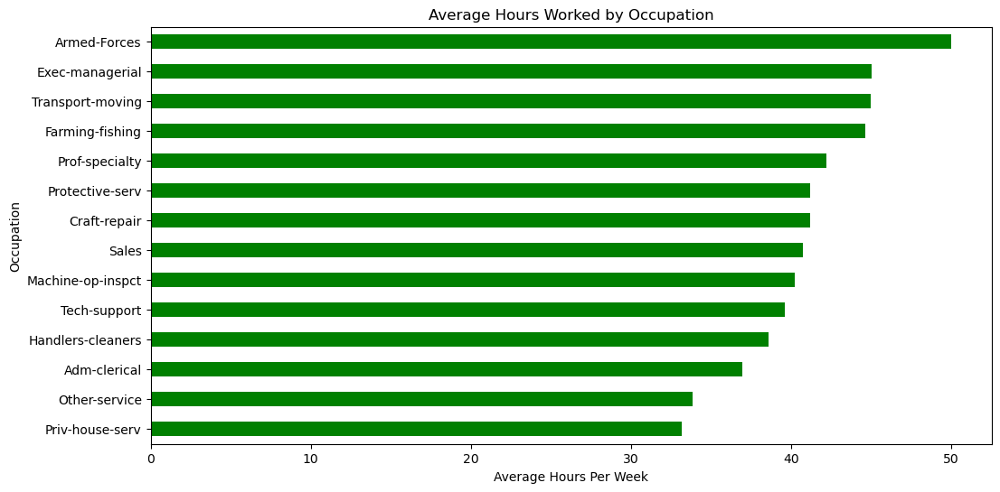

In [478]:
# Average hours worked by occupation
occupation_hours = adult.groupby('Occupation')['Hours_Per_Week'].mean().sort_values()

# Plot
plt.figure(figsize=(12, 6))
occupation_hours.plot(kind='barh', color='green')
plt.title('Average Hours Worked by Occupation')
plt.xlabel('Average Hours Per Week')
plt.ylabel('Occupation')
plt.show()


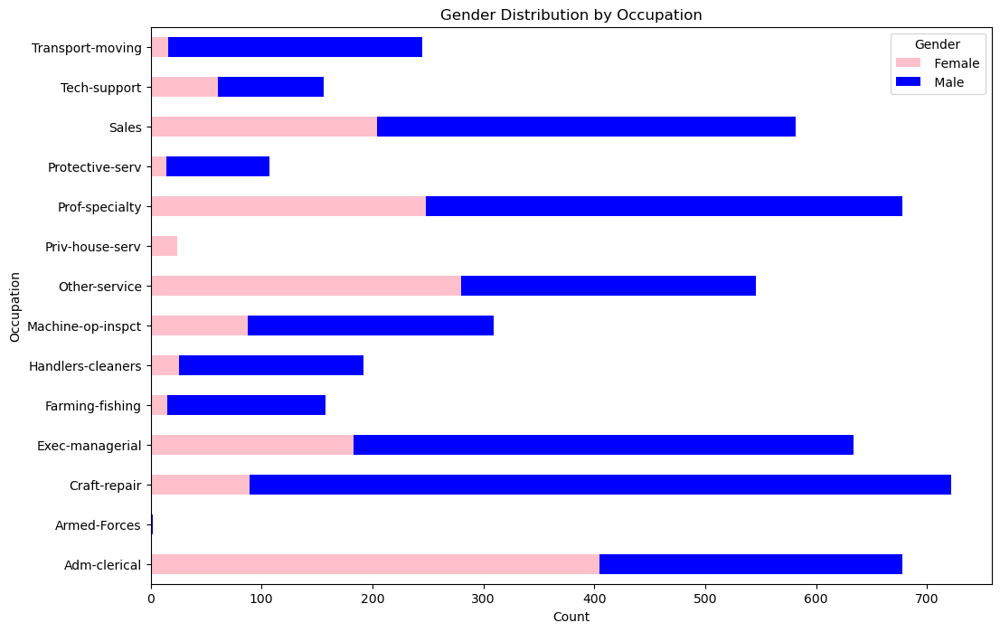

In [480]:
# Stacked bar chart for gender distribution by occupation
occupation_gender = adult.groupby(['Occupation', 'Gender']).size().unstack()

# Plot
occupation_gender.plot(kind='barh', stacked=True, figsize=(12, 8), color=['pink', 'blue'])
plt.title('Gender Distribution by Occupation')
plt.xlabel('Count')
plt.ylabel('Occupation')
plt.legend(title='Gender')
plt.show()


<Figure size 1200x600 with 0 Axes>

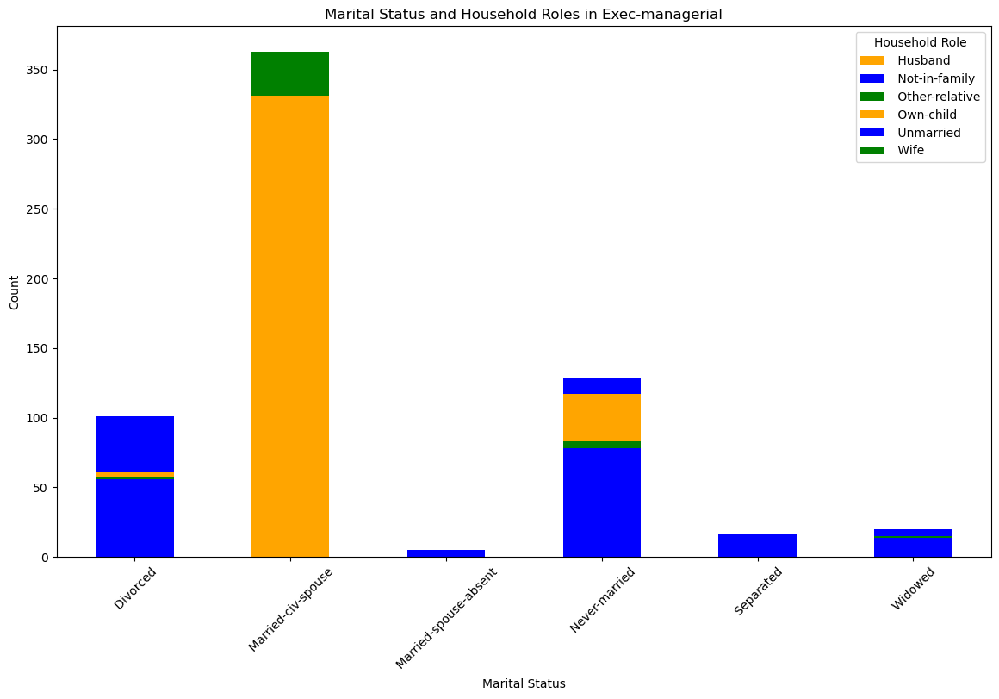

In [482]:
#  Analysis: Marital Status and Household Role in the Highest-Earning Occupation
# Identify the marital status and family roles of individuals in the top-earning occupation.

# Find the highest-earning occupation
highest_earning_occupation = adult.groupby('Occupation')['Income_Binary'].mean().idxmax()

# Filter data for the highest-earning occupation
high_earning_data = adult[adult['Occupation'] == highest_earning_occupation]

# Analyze marital status and household roles
marital_household = high_earning_data.groupby(['Marital_Status', 'Household_Role']).size().unstack()

# Plot the distribution
plt.figure(figsize=(12, 6))
marital_household.plot(kind='bar', stacked=True, figsize=(14, 8), color=['orange', 'blue', 'green'])
plt.title(f'Marital Status and Household Roles in {highest_earning_occupation}')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.legend(title='Household Role')
plt.xticks(rotation=45)
plt.show()


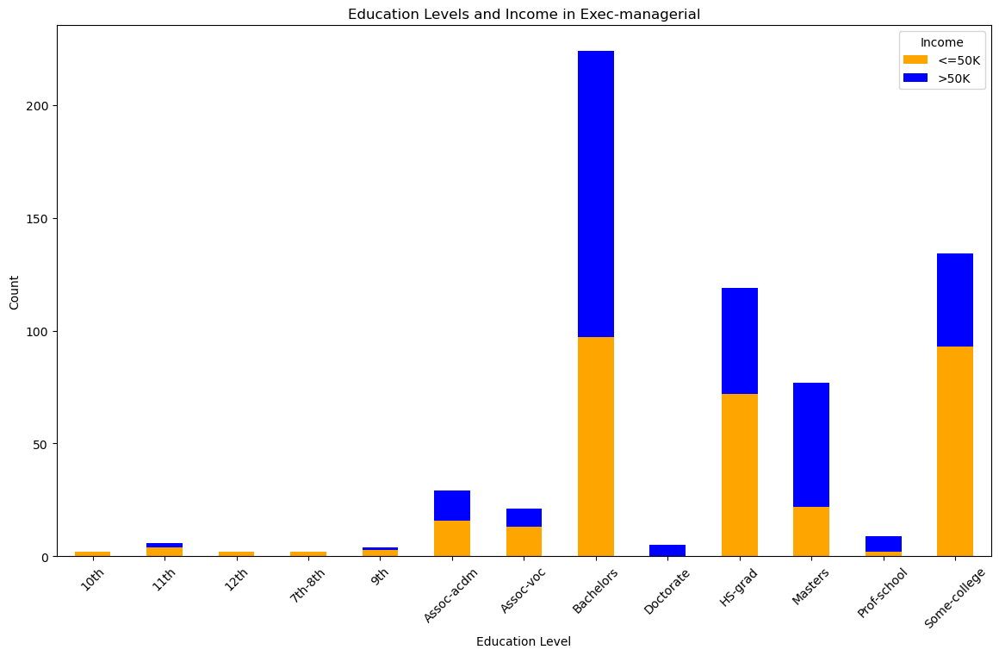

In [484]:
#  Analysis: Education Levels in the Highest-Earning Occupation
# Understand the education levels of individuals in the top-earning occupation and how they correlate with income.

education_income = high_earning_data.groupby(['Education', 'Income']).size().unstack()

education_income.plot(kind='bar', stacked=True, figsize=(14, 8), color=['orange', 'blue'])
plt.title(f'Education Levels and Income in {highest_earning_occupation}')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.legend(title='Income')
plt.xticks(rotation=45)
plt.show()


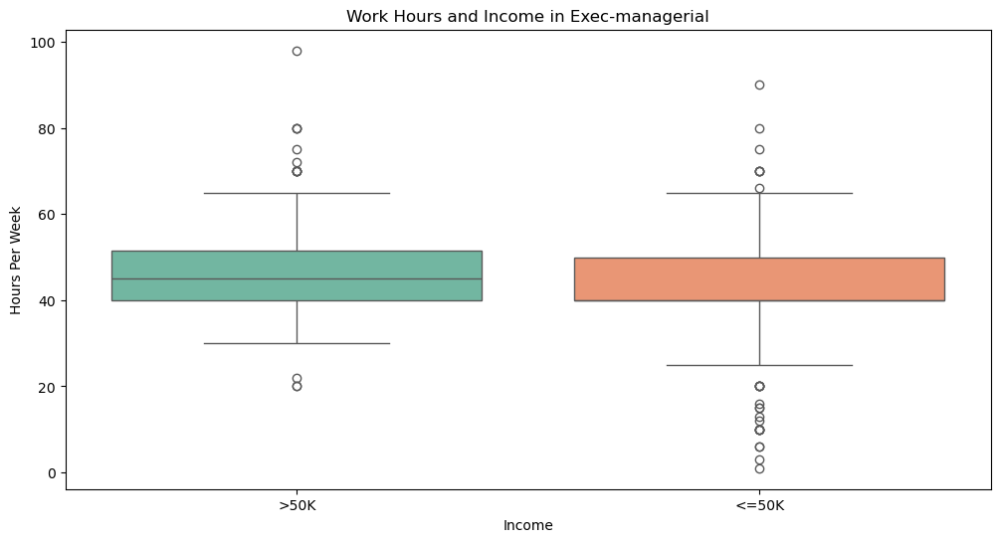

In [490]:
# Analysis: Work Hours and Income in the Highest-Earning Occupation
# Explore how working hours influence income in the top-earning occupation.

# Analyze hours worked and income in the highest-earning occupation
plt.figure(figsize=(12, 6))
sns.boxplot(data=high_earning_data, x='Income', y='Hours_Per_Week', hue='Income', palette='Set2')
plt.title(f'Work Hours and Income in {highest_earning_occupation}')
plt.xlabel('Income')
plt.ylabel('Hours Per Week')
plt.show()


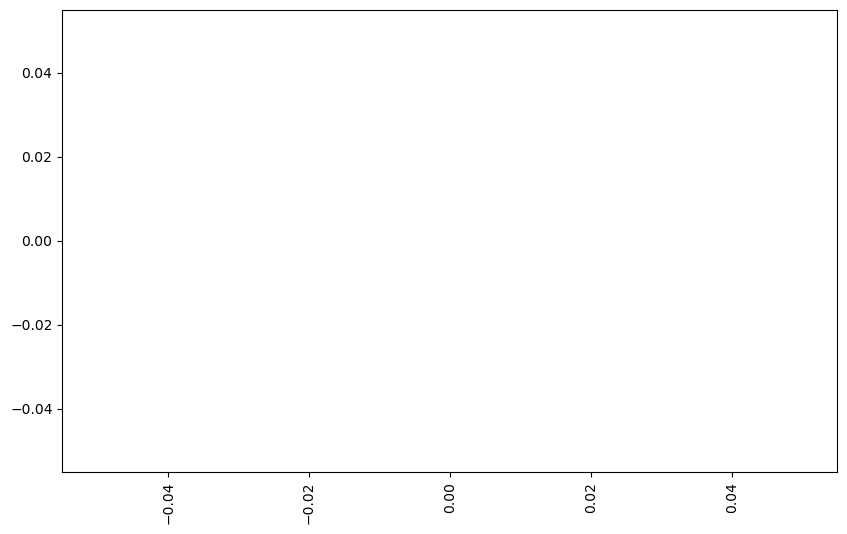

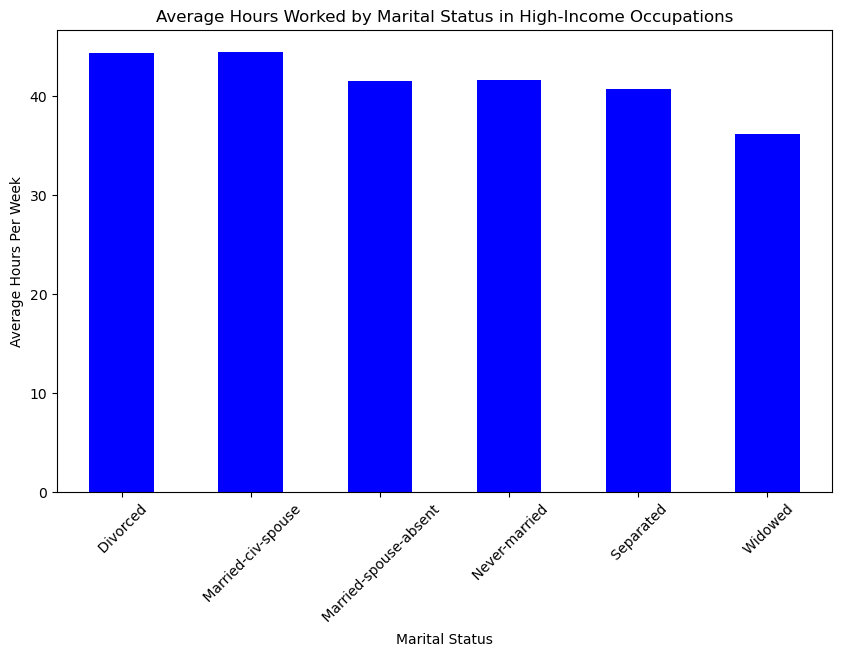

In [515]:
# Analysis: Work Hours and Marital Status in High-Income Occupations
# Explore the average hours worked across different marital statuses in high-income occupations.

# Use a lower threshold for filtering (e.g., 30% high earners)
high_income_occupations = adult.groupby('Occupation')['Income_Binary'].mean()
high_income_occupations = high_income_occupations[high_income_occupations > 0.3].index
high_income_data = adult[adult['Occupation'].isin(high_income_occupations)]

# Check high-income data
if high_income_data.empty:
    print("No high-income data available. Check filtering criteria.")
else:
    # Group by marital status and calculate average hours worked
    hours_marital = high_income_data.groupby('Marital_Status')['Hours_Per_Week'].mean()


    # Plot the data
    plt.figure(figsize=(10, 6))
    hours_marital.plot(kind='bar', color='blue')
    plt.title('Average Hours Worked by Marital Status in High-Income Occupations')
    plt.xlabel('Marital Status')
    plt.ylabel('Average Hours Per Week')
    plt.xticks(rotation=45)
    plt.show()


Empty DataFrame
Columns: []
Index: []


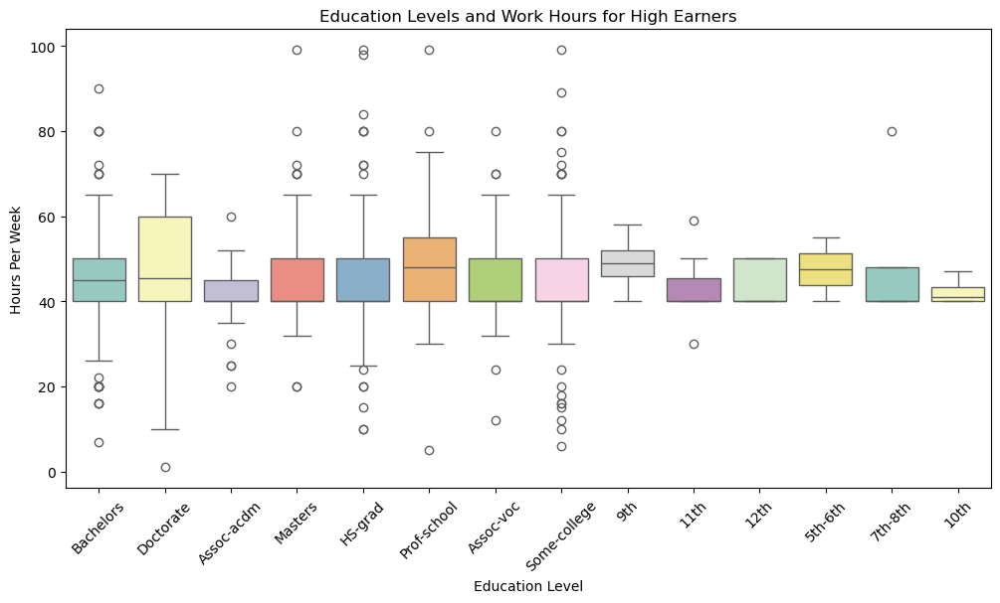

In [519]:
print(gender_marital.head())# Filter for individuals earning >50K
high_earners = adult[adult['Income_Binary'] == 1]

# Analyze education and work hours
plt.figure(figsize=(12, 6))
sns.boxplot(data=high_earners, x='Education', y='Hours_Per_Week', hue='Education', palette='Set3')
plt.title('Education Levels and Work Hours for High Earners')
plt.xlabel('Education Level')
plt.ylabel('Hours Per Week')
plt.xticks(rotation=45)
plt.show()


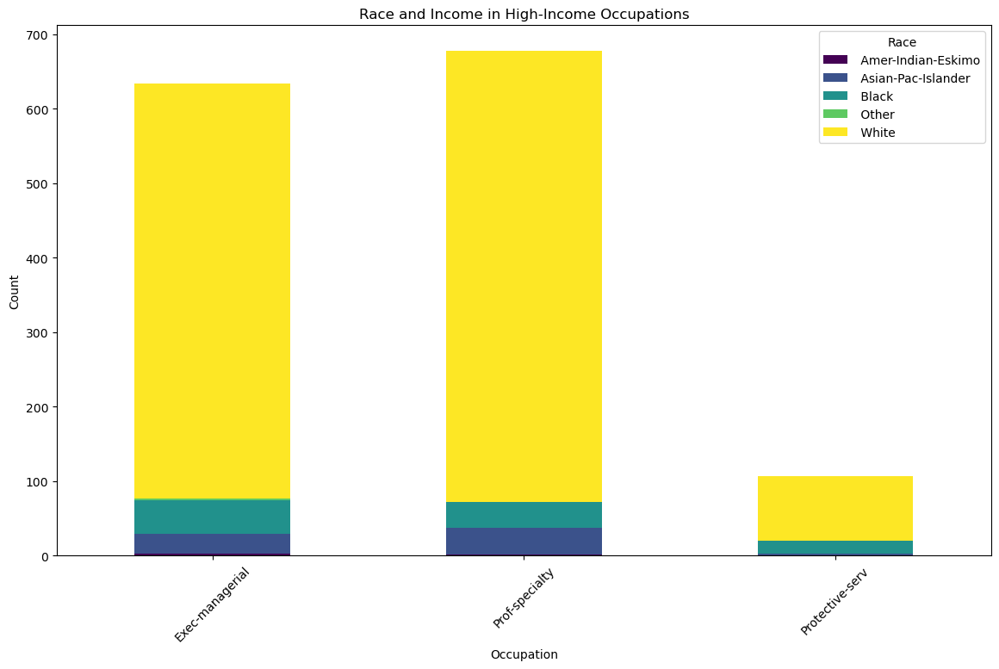

In [521]:
# Analyze race and income in high-income occupations
race_occupation = high_income_data.groupby(['Occupation', 'Race']).size().unstack()

# Plot
race_occupation.plot(kind='bar', stacked=True, figsize=(14, 8), cmap='viridis')
plt.title('Race and Income in High-Income Occupations')
plt.xlabel('Occupation')
plt.ylabel('Count')
plt.legend(title='Race')
plt.xticks(rotation=45)
plt.show()


In [523]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [525]:
X = adult[['Age', 'Education_Num', 'Hours_Per_Week', 'Capital_Gain', 'Capital_Loss']] 
y = adult['Income_Binary']  # Target variable: 1 for >50K, 0 for <=50K

In [527]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [529]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [531]:
from sklearn.linear_model import LogisticRegression

In [533]:
model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

In [535]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

In [537]:
print("Classification Report:")
print(classification_report(y_test, y_pred))

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
print(f"ROC-AUC Score: {roc_auc:.2f}")

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.93      0.87      1148
           1       0.62      0.36      0.46       362

    accuracy                           0.79      1510
   macro avg       0.72      0.65      0.67      1510
weighted avg       0.77      0.79      0.77      1510

Confusion Matrix:
[[1068   80]
 [ 231  131]]
ROC-AUC Score: 0.81


In [539]:
from sklearn.metrics import RocCurveDisplay

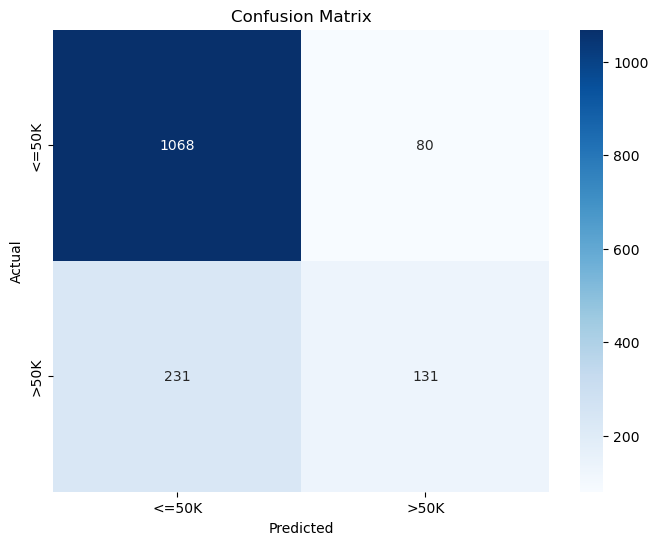

In [541]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['<=50K', '>50K'], yticklabels=['<=50K', '>50K'])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

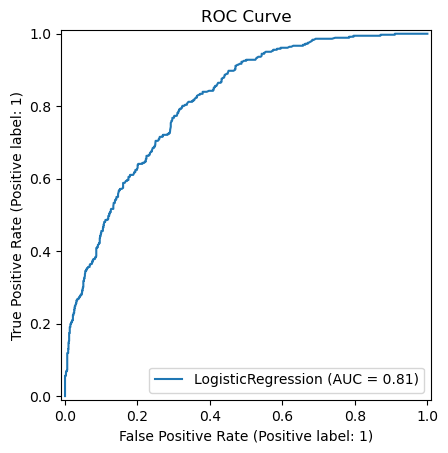

In [543]:
RocCurveDisplay.from_estimator(model, X_test, y_test)
plt.title("ROC Curve")
plt.show()